## Functions for adding trigger i.e poison

In [1]:
import numpy as np 
import pandas as pd 
import os
import seaborn as sns
import matplotlib.pyplot as plt
import random
import seaborn as sns
from collections import Counter

from PIL import Image
from skimage import io
import cv2 
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, Dataset
import torch.optim as optim

import torchvision.datasets
import torchvision.transforms as T 
from torchvision.io import read_image
from torchvision.datasets import DatasetFolder
from torchvision.datasets.folder import default_loader
from matplotlib.ticker import MaxNLocator
from torchvision.models import resnet50
from tqdm import tqdm
from sklearn.metrics import silhouette_score
import torch, torchvision
import shutil
import re
import cv2
import random
import math


## Function to get features/Activation values of the model 

In [2]:
normalize=T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
"""
Adapted Activation Clustering as a backdoor input detector.
For comparison and reference only.
"""

#for alexnet function 
#function to obtain activation values  
def get_pre_fc_layer_activations(model, input_tensor,device):
    model.eval()
    input_tensor=normalize(input_tensor)
    with torch.no_grad():
        x = input_tensor.to(device)
        x = model.conv1(x)
        x = model.bn1(x)
        x = model.relu(x)
        x = model.maxpool(x)
        
        x = model.layer1(x)
        x = model.layer2(x)
        x = model.layer3(x)
        x = model.layer4(x)
        gap = torch.nn.functional.adaptive_avg_pool2d(x, (1, 1))
        # Flatten the output for further processing, resulting in shape [N, C]
        activations = torch.flatten(gap, start_dim=1)
        # activations = torch.flatten(x, 1)
        return activations


## Poisoning function 

In [3]:
 
def overlay_image_alpha(img, img_overlay, x, y, alpha_mask):
    """
    Overlay `img_overlay` onto `img` at (x, y) position and blend using `alpha_mask`.
    
    Parameters:
    - img: The main image
    - img_overlay: The image we want to overlay on the main image
    - x, y: The top-left position where we want to place `img_overlay` on `img`
    - alpha_mask: A mask to use for blending (must have values in the range [0, 1])
    """
    # Define the region of interest in the main image where the overlay will be placed
    y1, y2 = max(0, y), min(img.shape[0], y + img_overlay.shape[0])
    x1, x2 = max(0, x), min(img.shape[1], x + img_overlay.shape[1])

    # Define the region of interest in the overlay image
    y1o, y2o = max(0, -y), min(img_overlay.shape[0], img.shape[0] - y)
    x1o, x2o = max(0, -x), min(img_overlay.shape[1], img.shape[1] - x)

    # Check if overlay and main image intersect, if not, return
    if y1 >= y2 or x1 >= x2 or y1o >= y2o or x1o >= x2o:
        return

    # Blend overlay within the determined regions
    img_crop = img[y1:y2, x1:x2]
    img_overlay_crop = img_overlay[y1o:y2o, x1o:x2o]
    alpha = alpha_mask[y1o:y2o, x1o:x2o, np.newaxis]  # Add an extra dimension for broadcasting
    alpha_inv = 1.0 - alpha

    img_crop[:] = alpha * img_overlay_crop + alpha_inv * img_crop


def add_patch_to_image(img, patch_path, position_state, patch_coverage_percentage):
    # Load the main image using OpenCV
#     img = cv2.imread(image_path)
    height, width = img.shape[:2]
    original_img_size=(height, width )
    img = cv2.resize(img, (224, 224))

    # Load the patch using OpenCV
    original_patch = cv2.imread(patch_path, cv2.IMREAD_UNCHANGED)
 

    # Calculate the desired patch area based on the coverage percentage
    desired_patch_area = patch_coverage_percentage * (224 * 224)
    patch_dimension = int(np.sqrt(desired_patch_area))
    # Resize the patch
    resized_patch = cv2.resize(original_patch, (patch_dimension, patch_dimension))
    
    height, width = img.shape[:2]
    center_x, center_y = width // 2, height // 2
    radius=80
    # Adjust radius to ensure the entire patch stays within image boundaries
    adjusted_radius = max(0, radius - patch_dimension)

    # Random angle and distance within the adjusted radius
    angle = random.uniform(0, 2 * math.pi)
    dist = random.uniform(0, adjusted_radius)

    # Choose a random or fixed position within the bounding box for the patch
    if position_state == "Random":

        # Calculate top-left corner of the patch
        x_position = int(center_x + dist * math.cos(angle) - patch_dimension / 2)
        y_position = int(center_y + dist * math.sin(angle) - patch_dimension / 2)

        # Ensure the patch is within image boundaries
        x_position = max(0, min(x_position, width - patch_dimension))
        y_position = max(0, min(y_position, height - patch_dimension))

    else:
        # Calculate the center position for the patch
        x_position = (width - patch_dimension) // 2
        y_position = (height - patch_dimension) // 2


    # Overlay the patch onto the main image
    patch_rgb = resized_patch[:, :, :3]
    patch_alpha = resized_patch[:, :, 3] / 255.0 if resized_patch.shape[2] == 4 else np.ones((patch_rgb.shape[0], patch_rgb.shape[1]))
#     img=overlay_image_weighted_blend(img, patch_rgb, x_position, y_position,1 )
    overlay_image_alpha(img, patch_rgb, x_position, y_position, patch_alpha)
    return img  



## Loading the Modal and the dataset

In [4]:
class BackdooredandClean(Dataset):
    def __init__(self, root_dir, transform=None, poison=False, poison_config=None, target_images_total=370, target_label=None):
        self.root_dir = root_dir
        self.transform = transform
        self.poison = poison
        self.poison_config = poison_config
        self.target_label = target_label  
        self.data = []
        self.class_counts = Counter()

        # Count total images to calculate the number of images to poison per class
        for class_id in os.listdir(root_dir):
            class_dir = os.path.join(root_dir, class_id)
            if os.path.isdir(class_dir):
                for filename in os.listdir(class_dir):
                    if filename.endswith(".jpg") or filename.endswith(".png"):
                        self.class_counts[int(class_id)] += 1

        total_images = sum(self.class_counts.values())
        target_images_per_class = {class_id: int((count / total_images) * target_images_total)
                                   for class_id, count in self.class_counts.items()}
#         print("Total images: ",total_images)
#         print("Target images per class: ",target_images_per_class)
#         print("All Total target: ",sum(target_images_per_class.values()))
        # Populate data and select images for poisoning
        for class_id in os.listdir(root_dir):
            class_dir = os.path.join(root_dir, class_id)
            if os.path.isdir(class_dir):
                all_images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                n_poison = target_images_per_class.get(int(class_id), 0)

                for i, filename in enumerate(all_images):
                    image_path = os.path.join(class_dir, filename)
                    # Original
                    self.data.append({'path': image_path, 'class_id': int(class_id), 'poison': False, 'target_label': int(class_id)}) 
                    if self.poison and i < n_poison:
                        # Duplicate entry for poisoning with a specified target label
                        self.data.append({'path': image_path, 'class_id': int(class_id), 'poison': True, 'target_label': self.target_label})  

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        item = self.data[index]
        image_path = item['path']
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        y_class = torch.tensor(item['class_id'])
        
        if item['poison']:
            # Apply patch if the item is marked for poisoning
            image = self.apply_patch(image)
            y_class = torch.tensor(item['target_label'])

        if self.transform:
            image = self.transform(image)

        return image, y_class,index

    def apply_patch(self, image):
        if not self.poison_config:
            return image  # Return the unmodified image if no poison config

        # Example placeholder for patch application logic
        # You will replace this with your actual patching code
        patch_path = self.poison_config.get('patch_path')
        position_state = self.poison_config.get('position_state', 'Random')
        patch_coverage_percentage = self.poison_config.get('patch_coverage_percentage', 0.01)

        image = add_patch_to_image(image, patch_path, position_state, patch_coverage_percentage)

        return image  # Return the image copy with the patch applied
    
    def get_class_distribution(self):
        """
        Returns a dictionary with counts of images in each class.
        """
        class_counts = Counter(item['class_id'] for item in self.data)
        return dict(class_counts)
    
    def remove_suspicious_indices(self, suspicious_indices):
        """
        Removes items at the given indices from the dataset.

        Parameters:
            suspicious_indices (list of int): Indices of the items to be removed from the dataset.
        """
        # Ensure indices are in descending order to avoid index shifting after removal
        suspicious_indices_sorted = sorted(suspicious_indices, reverse=True)
        for index in suspicious_indices_sorted:
            if index < len(self.data):
                # Remove the item at the specified index
                del self.data[index]
            else:
                print(f"Index {index} is out of bounds for the dataset size.")

In [5]:
class BackdooredValid(Dataset):
    def __init__(self, root_dir, transform=None, poison=True, poison_config=None, target_images_total=370, target_label=None):
        assert poison, "This dataset is intended to only contain poisoned images."
        self.root_dir = root_dir
        self.transform = transform
        self.poison_config = poison_config
        self.target_label = target_label
        self.data = []
        self.class_counts = Counter()

        # Pre-calculate the number of images to poison per class based on total images
        for class_id in os.listdir(root_dir):
            class_dir = os.path.join(root_dir, class_id)
            if os.path.isdir(class_dir):
                self.class_counts[int(class_id)] = len([filename for filename in os.listdir(class_dir) if filename.endswith(".jpg") or filename.endswith(".png")])
        
        total_images = sum(self.class_counts.values())
        target_images_per_class = {class_id: int((count / total_images) * target_images_total) for class_id, count in self.class_counts.items()}
#         print("Total images: ",total_images)
#         print("Target images per class: ",target_images_per_class)
#         print("All Total target: ",sum(target_images_per_class.values()))
        for class_id, class_dir in enumerate(os.listdir(root_dir)):
            if not os.path.isdir(os.path.join(root_dir, class_dir)):
                continue
            all_images = [f for f in os.listdir(os.path.join(root_dir, class_dir)) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            n_poison = min(target_images_per_class.get(int(class_id), 0), len(all_images))

            for i, filename in enumerate(all_images[:n_poison]):  # Corrected line
                image_path = os.path.join(root_dir, class_dir, filename)
                # Append poisoned image data with target label
                self.data.append({'path': image_path, 'class_id': int(class_id), 'target_label': self.target_label})

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        item = self.data[index]
        image_path = item['path']
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # Apply patch to the image
        image = self.apply_patch(image)
        
        if self.transform:
            image = self.transform(image)

        # Use the target label for the poisoned image
        y_class = torch.tensor(item['target_label'])

        return image, y_class

    def apply_patch(self, image):
        if not self.poison_config:
            return image  # Return the unmodified image if no poison config

        # Example placeholder for patch application logic
        # You will replace this with your actual patching code
        patch_path = self.poison_config.get('patch_path')
        position_state = self.poison_config.get('position_state', 'Random')
        patch_coverage_percentage = self.poison_config.get('patch_coverage_percentage', 0.01)

        image = add_patch_to_image(image, patch_path, position_state, patch_coverage_percentage)

        return image  
    
    def get_class_distribution(self):
        """
        Returns a dictionary with counts of images in each class.
        """
        class_counts = Counter(item['class_id'] for item in self.data)
        return dict(class_counts)



In [6]:
def get_ground_truth_from_csv(csv_path):
    """Load the CSV file and return a dictionary with filenames as keys and labels as values."""
    data = pd.read_csv(csv_path, delimiter=',')  # Use the comma delimiter
    # Assume 'Path' contains the image filename and 'ClassId' the label
    filenames = data['Path'].apply(os.path.basename).tolist()
    truth_dict = dict(zip(filenames, data['ClassId']))
    return truth_dict

class CleanTest(Dataset):
    def __init__(self, images_dir, csv_path, transform=None):
        self.images_dir = images_dir
        self.transform = transform
        self.data = []
        
        # Load ground truth from CSV
        self.ground_truth = get_ground_truth_from_csv(csv_path)
        
        # Populate data with image paths and labels
        for filename, class_id in self.ground_truth.items():
            image_path = os.path.join(images_dir, filename)
            self.data.append({
                'path': image_path,
                'class_id': class_id,
            })

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        item = self.data[index]
        image_path = item['path']
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if self.transform:
            image = self.transform(image)
        
        y_class = torch.tensor(item['class_id'])

        return image, y_class

class BackdooredTest(Dataset):
    def __init__(self, images_dir, csv_path, transform=None, poison=False, poison_config=None, target_label=None, num_poisoned_images=None):
        self.images_dir = images_dir
        self.transform = transform
        self.poison = poison
        self.poison_config = poison_config
        self.target_label = target_label
        self.num_poisoned_images = num_poisoned_images
        self.data = []
        
        # Load ground truth from CSV
        self.ground_truth = get_ground_truth_from_csv(csv_path)
        
        # Initialize a list to keep track of selected images for poisoning
        poisoned_indices = set()
        if poison and num_poisoned_images is not None:
            # Randomly select specified number of images for poisoning
            if num_poisoned_images <= len(self.ground_truth):
                poisoned_indices = set(random.sample(range(len(self.ground_truth)), num_poisoned_images))
            else:
                raise ValueError("Requested number of poisoned images exceeds total number of images available.")
        print("data length: ",len(poisoned_indices))
        # Populate data with image paths, labels, and poison information
        for i, (filename, class_id) in enumerate(self.ground_truth.items()):
            image_path = os.path.join(images_dir, filename)
            is_poisoned = i in poisoned_indices
            if is_poisoned:
                self.data.append({
                    'path': image_path,
                    'class_id': class_id,
                    'poison': is_poisoned,
                    'target_label': target_label if is_poisoned else class_id
                })

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        item = self.data[index]
        image_path = item['path']
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if item['poison']:
            # Apply patch if the item is marked for poisoning
            image = self.apply_patch(image)
        
        if self.transform:
            image = self.transform(image)
        
        y_class = torch.tensor(item['target_label'])

        return image, y_class

    def apply_patch(self, image):
        if not self.poison_config:
            return image  # Return the unmodified image if no poison config

        # Example placeholder for patch application logic
        # You will replace this with your actual patching code
        patch_path = self.poison_config.get('patch_path')
        position_state = self.poison_config.get('position_state', 'Random')
        patch_coverage_percentage = self.poison_config.get('patch_coverage_percentage', 0.01)

        image = add_patch_to_image(image, patch_path, position_state, patch_coverage_percentage)

        return image

## Visualization, Verification and  other helping  Detection 

In [7]:
def visualize_images(images, cols=5):
    """Visualize a list of images."""
    n_images = len(images)
    rows = n_images // cols + int(n_images % cols != 0)
    fig = plt.figure(figsize=(20, 4 * rows))
    for i, image in enumerate(images):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.imshow(image.permute(1, 2, 0))  # Convert from PyTorch format to matplotlib format
        ax.axis('off')
    plt.show()

        
def copy_suspicious_images(dataset, suspicious_indices, new_root_dir):
    if not os.path.exists(new_root_dir):
        os.makedirs(new_root_dir)
    
    for index in suspicious_indices:
        image_path = dataset.get_image_path_by_index(index)
        # Construct the new path under new_root_dir maintaining the original structure
        new_path = image_path.replace(dataset.root_dir, new_root_dir)
        # Create directories if they do not exist
        os.makedirs(os.path.dirname(new_path), exist_ok=True)
        # Copy the file
        shutil.copy2(image_path, new_path)
#         print(f"Copied {image_path} to {new_path}")

def verify_suspicious_indices(dataset, suspicious_indices, expected_class):
    verified_indices = []
    print("starting verification process")
    for idx in suspicious_indices:
        _,actual_class = dataset[idx]
#         print(f"image id:{idx}")
        if actual_class == expected_class:
            verified_indices.append(idx)
        else:
            print(f"Index {idx} does not belong to expected class {expected_class}, found in class {actual_class}.")
    print("done with verification process")
    return verified_indices


def calculate_fp_and_fpr(self, suspicious_indices):
    """
    Calculates the count of False Positives (FP) and the False Positive Rate (FPR)
    based on a list of suspicious indices. False Positives are non-poisoned images
    incorrectly flagged as suspicious.
    
    Parameters:
        suspicious_indices (list of int): Indices suspected to contain poisoned images.
    
    Returns:
        tuple: A tuple containing the count of false positives and the false positive rate.
    """
    # Count false positives
    false_positives = sum(1 for idx in suspicious_indices if idx < len(self.data) and not self.data[idx]['poison'])
    
    # Count the total number of non-poisoned images
    total_non_poisoned = sum(1 for item in self.data if not item['poison'])
    
    # Calculate true negatives (TN) as total non-poisoned minus false positives
    true_negatives = total_non_poisoned - false_positives
    
    # Calculate FPR = FP / (FP + TN); handle division by zero if applicable
    fpr = false_positives / (false_positives + true_negatives) if (false_positives + true_negatives) > 0 else 0
    
    print("False positives: ",false_positives)
    print(f"False Positive Rate: {fpr*100:.2f}%")
    
    return false_positives, fpr

def calculate_fn_and_fnr(self, suspicious_indices):
    """
    Calculates the count of False Negatives (FN) and the False Negative Rate (FNR)
    based on a list of suspicious indices. False Negatives are poisoned images not
    included in the suspicious indices.

    Parameters:
        suspicious_indices (list of int): Indices suspected to contain poisoned images.

    Returns:
        tuple: A tuple containing the count of false negatives and the false negative rate.
    """
    # Count false negatives
    false_negatives = sum(1 for idx, item in enumerate(self.data) if item['poison'] and idx not in suspicious_indices)
    
    # Count the total number of poisoned images
    total_poisoned = sum(1 for item in self.data if item['poison'])
    
    # Calculate true positives (TP) as total poisoned minus false negatives
    true_positives = total_poisoned - false_negatives
    
    # Calculate FNR = FN / (FN + TP); handle division by zero if applicable
    fnr = false_negatives / (false_negatives + true_positives) if (false_negatives + true_positives) > 0 else 0
    
    print("false_negatives: ",false_negatives)
    print(f"False Negative Rate: {fnr*100:.2f}%")
    return false_negatives, fnr


def visualize_clusters(projected_feats, labels, largest_cluster_center, title='KMeans Clustering'):
    # Assuming projected_feats is 2D or has been reduced to 2 principal components
    plt.figure(figsize=(8, 6))

    clean_label=0
    if labels.sum() >= len(labels) / 2.:
        clean_label = 1
    else:
        clean_label = 0

    poisonous_label = 1 - clean_label  # The other label is considered 'poisonous'
    
    # Plot each cluster using different colors and labels
    plt.scatter(projected_feats[labels == clean_label, 0], projected_feats[labels == clean_label, 1], 
                c='blue', label='Clean', marker='o')
    plt.scatter(projected_feats[labels == poisonous_label, 0], projected_feats[labels == poisonous_label, 1], 
                c='red', label='Poisonous', marker='x')
    
    # Plot the center of the largest cluster
    plt.scatter(largest_cluster_center[0], largest_cluster_center[1], 
                c='gold', label='Largest Cluster Center', marker='*', s=200)  # s is the size of the marker
    
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend()  # Display the legend to differentiate clean, poisonous, and the center
    plt.show()


## Activation Clustering Cleansing

In [8]:
#from sklearn.decomposition import PCA
#from sklearn.decomposition import FastICA
from sklearn.cluster import KMeans

def get_features_training(data_loader, model, num_classes, device):
    model.eval()  # Set the model to evaluation mode
    class_indices = [[] for _ in range(num_classes)]  # Initialize class indices
    feats = []  # Initialize the list for storing features
    local_to_global_index_map = {} 

    with torch.no_grad():  # Disable gradient computation
        sid = 0
        for i, (data, target,indices) in enumerate(tqdm(data_loader)):
            data, target = data.to(device), target.to(device)  # Move data to the specified device
            
            extracted_feats = get_pre_fc_layer_activations(model, data, device)  # Extract features
            this_batch_size = len(target)
            # print("batch: ",this_batch_size)
            for bid in range(this_batch_size):
                feats.append(extracted_feats[bid])  # Append extracted features
                b_target = target[bid].item()  # Get the class/target of the sample

                # Append the global dataset index of the sample
                global_index = indices[bid].item()
                local_to_global_index_map[sid+bid] = global_index 

            
                class_indices[b_target].append(sid + bid)  # Append the index of the sample
                # if b_target==14:
                #     print(f"Class: {b_target} || Map Index {sid + bid} ||Dataset Index: {indices[bid].item()} ||path: {data_loader.dataset.get_image_path_by_index(indices[bid].item())}")
            sid += this_batch_size  # Update the sample ID offset

    return feats, class_indices,local_to_global_index_map



# def cleanser_modified_0(inspection_split_loader, model, num_classes, device,verifier, clusters=3):
#     """
#         adapted from : https://github.com/hsouri/Sleeper-Agent/blob/master/forest/filtering_defenses.py
#     """
#     suspicious_indices = []

#     feats, class_indices,local_to_global_index_map = get_features_training(inspection_split_loader, model, num_classes,device)

#     myscore=[]
#     max_score=0
#     for target_class in range(num_classes):

#         # print('class - %d' % target_class)

#         if len(class_indices[target_class]) <= 1: continue # no need to perform clustering...

#         temp_feats = [feats[temp_idx].unsqueeze(dim=0) for temp_idx in class_indices[target_class]]
#         temp_feats = torch.cat( temp_feats , dim=0)
#         temp_feats = temp_feats - temp_feats.mean(dim=0)

#         _, _, V = torch.svd(temp_feats, compute_uv=True, some=False)

#         axes = V[:, :10]
#         projected_feats = torch.matmul(temp_feats, axes)
#         projected_feats = projected_feats.cpu().numpy()

#         # print("Shape of projected features: ",projected_feats.shape)

#         # print('start k-means')
#         kmeans = KMeans(n_clusters=clusters,n_init=10).fit(projected_feats)
#         # print('end k-means')

# #         # by default, take the large cluster as the clean cluster (since all inference-time backdoor inputs are in the target class)
# #         if kmeans.labels_.sum() >= len(kmeans.labels_) / 2.:
# #             clean_label = 1
# #         else:
# #             clean_label = 0
#         # Identify the largest cluster
#         cluster_sizes = np.bincount(kmeans.labels_)
#         clean_label = np.argmax(cluster_sizes)
#         print("clean label is: ",clean_label)

#         outliers_local_indices = []
#         for (bool, idx) in zip((kmeans.labels_ != clean_label).tolist(), list(range(len(kmeans.labels_)))):
#             if bool:
#                 outliers_local_indices.append(class_indices[target_class][idx])
        
#           # Map local class-specific indices to global indices
#         outliers_global_indices = [local_to_global_index_map[local_idx] for local_idx in outliers_local_indices]

# #         verify_suspicious_indices(inspection_split_loader.dataset, outliers_global_indices, target_class)

#         score = silhouette_score(projected_feats, kmeans.labels_)
#         print('[class-%d] silhouette_score = %f || ratio of %f ' % (target_class, score,len(outliers_global_indices)/len(kmeans.labels_) ))
#         # if score > threshold:# and len(outliers) < len(kmeans.labels_) * 0.35:
#         myscore.append(score)

        
#         if len(outliers_global_indices) < len(kmeans.labels_) * 0.40: # if one of the two clusters is abnormally large
#             # print(f"Outlier Num in Class {target_class}:", len(outliers_global_indices))
#             if max_score<score: 
#                 # verify_suspicious_indices(inspection_split_loader.dataset, outliers_global_indices, target_class)
# #                 visualize_clusters(projected_feats, kmeans.labels_, title=f'Class {target_class} Clustering')
#                 visualize_clusters(projected_feats, kmeans.labels_, n_clusters=clusters)
#                 suspicious_indices = outliers_global_indices.copy()
#                 max_score=score  
#     most_suspicious_class=np.array(myscore).argmax()
#     print("The poisoned class is: ",most_suspicious_class)
#     return most_suspicious_class,suspicious_indices

def cleanser(inspection_split_loader, model, num_classes, device,verifier, clusters=2,num_axes=10):
    """
        adapted from : https://github.com/hsouri/Sleeper-Agent/blob/master/forest/filtering_defenses.py
    """


    suspicious_indices = []

    feats, class_indices,local_to_global_index_map = get_features_training(inspection_split_loader, model, num_classes,device)

    myscore=[]
    max_score=0
    for target_class in range(num_classes):

        # print('class - %d' % target_class)

        if len(class_indices[target_class]) <= 1: continue # no need to perform clustering...

        temp_feats = [feats[temp_idx].unsqueeze(dim=0) for temp_idx in class_indices[target_class]]
        temp_feats = torch.cat( temp_feats , dim=0)
        temp_feats = temp_feats - temp_feats.mean(dim=0)

        _, _, V = torch.svd(temp_feats, compute_uv=True, some=False)

        axes = V[:, :num_axes]
        projected_feats = torch.matmul(temp_feats, axes)
        projected_feats = projected_feats.cpu().numpy()

        # print("Shape of projected features: ",projected_feats.shape)

        # print('start k-means')
        kmeans = KMeans(n_clusters=clusters,n_init=10).fit(projected_feats)
        # print('end k-means')

        # by default, take the large cluster as the clean cluster (since all inference-time backdoor inputs are in the target class)
        if kmeans.labels_.sum() >= len(kmeans.labels_) / 2.:
            clean_label = 1
        else:
            clean_label = 0
#         Identify the largest cluster
        outliers_local_indices = []
        for (bool, idx) in zip((kmeans.labels_ != clean_label).tolist(), list(range(len(kmeans.labels_)))):
            if bool:
                outliers_local_indices.append(class_indices[target_class][idx])
        
          # Map local class-specific indices to global indices
        outliers_global_indices = [local_to_global_index_map[local_idx] for local_idx in outliers_local_indices]

#         verify_suspicious_indices(inspection_split_loader.dataset, outliers_global_indices, target_class)

        score = silhouette_score(projected_feats, kmeans.labels_)
        print('[class-%d] silhouette_score = %f || ratio of %f ' % (target_class, score,len(outliers_global_indices)/len(kmeans.labels_) ))
        # if score > threshold:# and len(outliers) < len(kmeans.labels_) * 0.35:
        myscore.append(score)

        
        if len(outliers_global_indices) < len(kmeans.labels_) * 0.40: # if one of the two clusters is abnormally large
            # print(f"Outlier Num in Class {target_class}:", len(outliers_global_indices))
            if max_score<score: 
                # verify_suspicious_indices(inspection_split_loader.dataset, outliers_global_indices, target_class)
#                 visualize_clusters(projected_feats, kmeans.labels_, title=f'Class {target_class} Clustering')
                suspicious_indices = outliers_global_indices.copy()
                max_score=score  
    most_suspicious_class=np.array(myscore).argmax()
    print("The poisoned class is: ",most_suspicious_class)
    return most_suspicious_class,suspicious_indices


# #this is the original version of this function from their paper 
# def cleanser(inspection_split_loader, model, num_classes, device,verifier, clusters=2):
#     """
#         adapted from : https://github.com/hsouri/Sleeper-Agent/blob/master/forest/filtering_defenses.py
#     """


#     suspicious_indices = []

#     feats, class_indices,local_to_global_index_map = get_features_training(inspection_split_loader, model, num_classes,device)

#     myscore=[]
#     max_score=0
#     for target_class in range(num_classes):

#         # print('class - %d' % target_class)

#         if len(class_indices[target_class]) <= 1: continue # no need to perform clustering...

#         temp_feats = [feats[temp_idx].unsqueeze(dim=0) for temp_idx in class_indices[target_class]]
#         temp_feats = torch.cat( temp_feats , dim=0)
#         temp_feats = temp_feats - temp_feats.mean(dim=0)

#         _, _, V = torch.svd(temp_feats, compute_uv=True, some=False)

#         axes = V[:, :10]
#         projected_feats = torch.matmul(temp_feats, axes)
#         projected_feats = projected_feats.cpu().numpy()

#         # print("Shape of projected features: ",projected_feats.shape)

#         # print('start k-means')
#         kmeans = KMeans(n_clusters=clusters,init='k-means++').fit(projected_feats)
#         # print('end k-means')

#         score = silhouette_score(projected_feats, kmeans.labels_)
        
#         # by default, take the large cluster as the clean cluster (since all inference-time backdoor inputs are in the target class)
#         if kmeans.labels_.sum() >= len(kmeans.labels_) / 2.:
#             clean_label = 1
#         else:
#             clean_label = 0
 
#         largest_cluster_center = kmeans.cluster_centers_[clean_label]
# #         print("clean label is: ",clean_label)

#         outliers_local_indices = []
#         for (bool, idx) in zip((kmeans.labels_ != clean_label).tolist(), list(range(len(kmeans.labels_)))):
#             if bool:
#                 outliers_local_indices.append(class_indices[target_class][idx])
              
#          # Map local class-specific indices to global indices in the dataset
#         outliers_global_indices = [local_to_global_index_map[local_idx] for local_idx in outliers_local_indices]
#         print('[class-%d] BEFORE: silhouette_score = %f || ratio of %f ' % (target_class, score,len(outliers_global_indices)/len(kmeans.labels_) ))
#         #EXTRA STEPS TO REMOVE MORE OUTLIERS USING DISTANCE METRICS
#         # Calculate the Centroid of the Largest Cluster
#         largest_cluster_center = kmeans.cluster_centers_[clean_label]

#         # Determine a Distance Threshold
#         # This is an example; you might want to calculate this value based on your data
#         distances_to_center = np.linalg.norm(projected_feats - largest_cluster_center, axis=1)
#         threshold = np.percentile(distances_to_center, 90)

# #         print(f"threshold is: {threshold} || largest cluster is {clean_label}")
#         outliers_global_indices = []
#         for idx, (point, label) in enumerate(zip(projected_feats, kmeans.labels_)):
#             distance_to_center = np.linalg.norm(point - largest_cluster_center)
#             global_idx = local_to_global_index_map[class_indices[target_class][idx]]
#             if distance_to_center > threshold and global_idx not in suspicious_indices:  # Avoid duplicates:
#                 outliers_global_indices.append(global_idx)
        

        
#         print('[class-%d] AFTER: silhouette_score = %f || ratio of %f ' % (target_class, score,len(outliers_global_indices)/len(kmeans.labels_) ))
#         # if score > threshold:# and len(outliers) < len(kmeans.labels_) * 0.35:
#         myscore.append(score)

#          # if one of the two clusters is abnormally small, then we have suspicious indices 
#         if len(outliers_global_indices) < len(kmeans.labels_) * 0.45:
#             #only record the score if we have highest silhoutte score
#             if max_score<score: 
#                 visualize_clusters(projected_feats, kmeans.labels_,largest_cluster_center, title=f'Class {target_class} Clustering')
#                 suspicious_indices = outliers_global_indices.copy()
#                 max_score=score  
#     most_suspicious_class=np.array(myscore).argmax()
#     print("The poisoned class is: ",most_suspicious_class)
#     return most_suspicious_class,suspicious_indices



## Plotting accuracies

In [9]:
def plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, val_acc,val_backdoored_acc):
    # Convert the lists to numpy arrays for indexing
    train_loss = np.array([tl.cpu() if isinstance(tl, torch.Tensor) else tl for tl in train_loss])
#     val_loss = np.array([vl.cpu() if isinstance(vl, torch.Tensor) else vl for vl in val_loss])
    train_acc = np.array([ta.cpu() if isinstance(ta, torch.Tensor) else ta for ta in train_acc])
    val_acc = np.array([va.cpu() if isinstance(va, torch.Tensor) else va for va in val_acc])
    val_backdoored_acc = np.array([vb.cpu() if isinstance(vb, torch.Tensor) else vb for vb in val_backdoored_acc])
    epochs = len(train_loss) 

    plt.figure(figsize=(12, 4))

    # Plotting Loss
    plt.subplot(1, 2, 1)
    sns.lineplot(x=range(1, 1+epochs), y=train_loss, label='Training Loss')
    sns.lineplot(x=range(1, 1+epochs), y=clean_val_loss, label='Clean Loss')
    sns.lineplot(x=range(1, 1+epochs), y=backdoored_val_loss, label='Backdoored Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss over epochs')
    plt.legend()
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # Plotting Accuracy
    plt.subplot(1, 2, 2)
    sns.lineplot(x=range(1, 1+epochs), y=train_acc, label='Training Accuracy')
    sns.lineplot(x=range(1, 1+epochs), y=val_acc, label='Clean Accuracy')
    sns.lineplot(x=range(1, 1+epochs), y=val_backdoored_acc, label='Backdoored Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Accuracy over epochs')
    plt.legend()
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    plt.tight_layout()
    plt.show()


## Testing trained Model on test set using ground truth values i.e in csv file

In [10]:
def test_clean(model,Cleantestloader,device):
    model.eval()
    # since we're not training, we don't need to calculate the gradients for our outputs
    correct = 0
    total = 0
    with torch.no_grad():
        for data in Cleantestloader:
            images, labels = data
            images , labels= images.to(device) , labels.to(device)
            # calculate outputs by running images through the network
            outputs = model(images)
            # the class with the highest energy is what we choose as prediction
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f'Clean AccuracyAccuracy of the network on the 10000 test images: {100 * correct // total} %')


def test_backdoored(model,backdooredTestloader,device):
    model.eval()
    # since we're not training, we don't need to calculate the gradients for our outputs
    correct = 0
    total = 0
    with torch.no_grad():
        for data in backdooredTestloader:
            images, labels = data
            images , labels= images.to(device) , labels.to(device)
            # calculate outputs by running images through the network
            outputs = model(images)
            # the class with the highest energy is what we choose as prediction
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f'Backdoor Accuracy: {100 * correct // total} %')



## Training function 

In [11]:
   
def Train(model,criterion,optimizer,num_epochs,batch_size,dataloaders,out_path,device):
        best_model_weights = model.state_dict()
        best_acc = 0.0
        train_loss, val_clean_loss, val_backdoored_loss= [], [], []
        train_acc, val_clean_acc,val_backdoored_acc = [], [], []
    
        for epoch in range(num_epochs):
            print("epoch {}/{}".format(epoch+1,num_epochs))
            print("*" * 10)

            for x in ["training","clean","backdoor"]:
                if x == "training" :
                    model.train()
                else:
                    model.eval()

                running_loss = 0.0
                running_accuracy = 0

                for data in dataloaders[x]:
                    img , y,_ = data
                    img , y = img.to(device) , y.to(device)

                    optimizer.zero_grad()
                    y_pred = model(img)
                    loss = criterion(y_pred,y)
                    _, preds = torch.max(y_pred, dim=1)

                    if x == 'training':
                        loss.backward()
                        optimizer.step()

                    running_loss += loss.item()
                    running_accuracy += torch.sum(preds == y.data)


                epoch_loss = running_loss / dataset_sizes[x]
                epoch_acc = running_accuracy / dataset_sizes[x]

                print('{} Loss: {:.4f} || Accuracy: {:.4f}'.format(x, epoch_loss, epoch_acc))

                # Save metrics
                if x == 'training':
                    train_loss.append(epoch_loss)
                    train_acc.append(epoch_acc)
                elif x == "clean":
                    val_clean_loss.append(epoch_loss)
                    val_clean_acc.append(epoch_acc)
                else:
                    val_backdoored_loss.append(epoch_loss)
                    val_backdoored_acc.append(epoch_acc)

                # deep copy the model
                if x == 'clean' and epoch_acc > best_acc:
                    best_acc = epoch_acc


        # load best model weights
        torch.save(model.state_dict(), out_path)
        return train_loss, val_clean_loss, val_backdoored_loss, train_acc, val_clean_acc,val_backdoored_acc, best_acc

In [12]:
import torch

from sklearn.cluster import KMeans

def get_features_training(data_loader, model, num_classes, device):
    model.eval()  # Set the model to evaluation mode
    class_indices = [[] for _ in range(num_classes)]  # Initialize class indices
    feats = []  # Initialize the list for storing features
    local_to_global_index_map = {} 

    with torch.no_grad():  # Disable gradient computation
        sid = 0
        for i, (data, target,indices) in enumerate(tqdm(data_loader)):
            data, target = data.to(device), target.to(device)  # Move data to the specified device
            
            extracted_feats = get_pre_fc_layer_activations(model, data, device)  # Extract features
            this_batch_size = len(target)
            # print("batch: ",this_batch_size)
            for bid in range(this_batch_size):
                feats.append(extracted_feats[bid])  # Append extracted features
                b_target = target[bid].item()  # Get the class/target of the sample

                # Append the global dataset index of the sample
                global_index = indices[bid].item()
                local_to_global_index_map[sid+bid] = global_index 

            
                class_indices[b_target].append(sid + bid)  # Append the index of the sample
                # if b_target==14:
                #     print(f"Class: {b_target} || Map Index {sid + bid} ||Dataset Index: {indices[bid].item()} ||path: {data_loader.dataset.get_image_path_by_index(indices[bid].item())}")
            sid += this_batch_size  # Update the sample ID offset

    return feats, class_indices,local_to_global_index_map


def compute_spectral_signature_torch(feats):
    # Ensure feats is a PyTorch tensor
    if not isinstance(feats, torch.Tensor):
        feats = torch.tensor(feats, dtype=torch.float32)
    
    # Center the features
    feats_centered = feats - torch.mean(feats, axis=0, keepdim=True)
    
    # Compute covariance matrix
    cov_matrix = torch.mm(feats_centered.T, feats_centered) / (feats_centered.size(0) - 1)
    
    # Apply SVD to the covariance matrix using torch
    u, s, vh = torch.svd(cov_matrix)
    
    return u, s, vh

def spectral_cleanser_torch(inspection_split_loader, model, num_classes, device, verifier, percentile=55):
    suspicious_indices = []

    feats, class_indices, local_to_global_index_map = get_features_training(inspection_split_loader, model, num_classes, device)

#     if not isinstance(feats, torch.Tensor):
#         feats = torch.tensor(feats, dtype=torch.float32, device=device)
    max_score=0
    myscore=[]
    for target_class in range(num_classes):
        if len(class_indices[target_class]) <= 1: continue

        # Extract features for the current class, ensuring it's a PyTorch tensor
        temp_feats = [feats[temp_idx].unsqueeze(dim=0) for temp_idx in class_indices[target_class]]
        temp_feats = torch.cat( temp_feats , dim=0)
        class_feats=temp_feats
        temp_feats = temp_feats - temp_feats.mean(dim=0)

                
        # Compute spectral signature (SVD) of the class features using PyTorch
        _, singular_values, _= compute_spectral_signature_torch(class_feats)
        
#         if len(class_indices[target_class]) <= 1: continue # no need to perform clustering...

#         temp_feats = [feats[temp_idx].unsqueeze(dim=0) for temp_idx in class_indices[target_class]]
#         temp_feats = torch.cat( temp_feats , dim=0)
#         temp_feats = temp_feats - temp_feats.mean(dim=0)

        _, _, V = torch.svd(temp_feats, compute_uv=True, some=False)


        axes = V[:, :10]
                # print("Shape of projected features: ",projected_feats.shape)
        projected_feats = torch.matmul(temp_feats, axes)
        projected_feats = projected_feats.cpu().numpy()

#         print("shape of temp features values: ",temp_feats.shape)
#         print("shape of singular values: ",singular_values.shape)
#         print("shape of projected features: ",projected_feats.shape)
        # print('start k-means')
        kmeans = KMeans(n_clusters=2,init='k-means++').fit(projected_feats)
        # print('end k-means')

        score = silhouette_score(projected_feats, kmeans.labels_)

        # Note: Adjust the shape of class_feats if necessary to match the matrix multiplication requirements
        scores = torch.mm(class_feats, axes).squeeze()  # Squeeze to convert from 2D to 1D if needed
        scores = torch.norm(scores, dim=1)  # Compute the norm if scores represent vectors

        # Convert scores to numpy for percentile computation
        scores_np = scores.cpu().numpy()
        threshold_value = np.percentile(scores_np, percentile)

        # Identify outliers based on the threshold
        outliers_indices = np.where(scores_np > threshold_value)[0]

        outlier_global_indices=[]
        # Map local class-specific indices to global indices for marking suspicious samples
        for idx in outliers_indices:
            global_idx = local_to_global_index_map[class_indices[target_class][idx]]
            outlier_global_indices.append(global_idx)

        print('[class-%d]silhouette_score = %f || threshold= %f' % (target_class, score,threshold_value))
        # if score > threshold:# and len(outliers) < len(kmeans.labels_) * 0.35:
        myscore.append(score)

            #only record the score if we have highest silhoutte score
        if max_score<score: 
#             visualize_clusters(projected_feats, kmeans.labels_,largest_cluster_center, title=f'Class {target_class} Clustering')
            suspicious_indices = outlier_global_indices.copy()
            max_score=score  
    most_suspicious_class=np.array(myscore).argmax()
    print("The poisoned class is: ",most_suspicious_class)
    return most_suspicious_class,suspicious_indices

## Training again from scratch patch 1 and 2 old metrics

In [18]:
import torchvision.transforms as T 
from torch.utils.data import DataLoader, random_split, Dataset

configurations = [
    {'test_number': 1, 'shape': 'Square', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
    {'test_number': 2, 'shape': 'Square', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
    {'test_number': 3, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
    {'test_number': 4, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
    {'test_number': 5, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
    {'test_number': 6, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
    {'test_number': 7, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
    {'test_number': 8, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 9, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 10, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 11, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 12, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 13, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 14, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 15, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 16, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 17, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 18, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 19, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 20, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 21, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 22, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 23, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 24, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
]


#import the patches
patch_1 = 'gtsrb-german-traffic-sign/Patches/patch_1.png'
patch_1_circle = 'gtsrb-german-traffic-sign/Patches/patch_1_circle.png'
patch_1_triangle = 'gtsrb-german-traffic-sign/Patches/patch_1_triangle.png'
patch_2= 'gtsrb-german-traffic-sign/Patches/patch_2.png'
patch_2_circle = 'gtsrb-german-traffic-sign/Patches/patch_2_circle.png'
patch_2_triangle = 'gtsrb-german-traffic-sign/Patches/patch_2_triangle.png'


training_root_dir = 'gtsrb-german-traffic-sign/Train_og'
validation_root_dir = 'gtsrb-german-traffic-sign/Clean_Validation'   
test_images_dir = 'gtsrb-german-traffic-sign/Test'
test_csv_path = 'gtsrb-german-traffic-sign/Test.csv'

# data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True),T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True)])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for config in configurations:
    # Extract the configuration details
    test_number = config['test_number']
    shape = config['shape']
    position_state = config['location']
    patch_coverage_percentage = config['coverage']
    pattern = config['pattern']
    print("Training Configuration: ",test_number)
    
    # Map pattern to the appropriate patch path
    if pattern == 'patch_1':
        if shape=='Square':
            patch_path = patch_1  
        elif shape=='Circle':
            patch_path = patch_1_circle  
        elif shape=='Triangle':
            patch_path = patch_1_triangle  
    elif pattern == 'patch_2':
        if shape=='Square':
            patch_path = patch_2  
        elif shape=='Circle':
            patch_path = patch_2_circle  
        elif shape=='Triangle':
            patch_path = patch_2_triangle  
            
    poison_config = {
    'patch_path': patch_path,
    'position_state': position_state,  
    'patch_coverage_percentage': patch_coverage_percentage, 
    }
    
    training_target_img = 350
    valid_target_img = 105
    target_label = 14  # Assuming you want all poisoned images to have the same target label

    #TRAINING DATA(CLEAN AND BACKDOORED)
    train_dataset = BackdooredandClean(root_dir=training_root_dir,transform=data_transforms,
                    poison=True,poison_config=poison_config,target_images_total=training_target_img,target_label=target_label)
    train_loader = DataLoader(dataset=train_dataset, batch_size=40, shuffle=True)
    
#     #CLEAN VALIDATION
#     clean_validation_dataset = BackdooredandClean(root_dir=validation_root_dir,transform=data_transforms,
#                             poison=False,poison_config=poison_config,target_images_total=0, target_label=target_label)
#     clean_val_loader = DataLoader(dataset=clean_validation_dataset, batch_size=32, shuffle=False)
#     print("validation length: ",len(clean_val_loader.dataset))
#     #BACKDOORED VALIDATION
#     backdoored_validation_dataset = BackdooredValid(root_dir=validation_root_dir,transform=data_transforms,poison=True,
#                             poison_config=poison_config,target_images_total=valid_target_img,target_label=target_label)
#     backdoor_val_loader = DataLoader(dataset=backdoored_validation_dataset, batch_size=32, shuffle=False)

    
#     Test_clean_dataset = CleanTest(test_images_dir, test_csv_path, transform=data_transforms)
#     clean_test_loader = DataLoader(dataset=Test_clean_dataset, batch_size=32, shuffle=False)

#     test_poisoned_img = 400  # Specify how many images you want to poison
#     Test_backdoored_dataset = BackdooredTest(test_images_dir, test_csv_path, transform=data_transforms, poison=True, poison_config=poison_config, target_label=target_label, num_poisoned_images=test_poisoned_img)
#     backdoor_test_loader = DataLoader(dataset=Test_backdoored_dataset, batch_size=32, shuffle=False)

#     dataloaders = {'training':train_loader,"clean": clean_val_loader, "backdoor": backdoor_val_loader}
#     dataset_sizes = {'training':len(train_loader.dataset), "clean": len(clean_val_loader.dataset), "backdoor": len(backdoor_val_loader.dataset)}
#     print(dataset_sizes)
    
#     #splitting the data into training and validation 
#     L1 = len(clean_test_loader.dataset)
#     L2 = len(Test_backdoored_dataset)
#     print(f"Total length of Dataset Imported: ",L1,L2)
    
    #     # Initialize the model
    num_classes = 43  # The number of output classes in your trained model
    model = resnet50(weights=None)  # Load the model without pretrained weights
    num_classes = 43
    model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the fully connected layer
    model_path=f"Final_Models/resnet50_epochs100_backdoored_config{test_number}.pt"
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)


    ##CLEANING THE TRAINING DATASET################################
    # Assuming suspicious_indices is a list of indices for suspicious images
    most_suspicious_class,suspicious_indices = cleanser(train_loader, model, num_classes, device,verify_suspicious_indices)
    print("Len of suspicious indices: ",len(suspicious_indices))

    calculate_fp_and_fpr(train_loader.dataset, suspicious_indices)

    calculate_fn_and_fnr(train_loader.dataset, suspicious_indices)
    
        
#     # Initialize the model
#     model = resnet50(weights=None, num_classes=43).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)
#     num_epochs = 5
#     out_path = f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"

#     # Store metrics
#     train_loss, clean_val_loss,backdoored_val_loss = [], [], []
#     train_acc, clen_val_acc,val_backdoored_acc = [], [], []
#     # Train the model
#     plot_file_name = f"plots/test_1_plot_of_config_{test_number}.png"
#     train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc, val_backdoored_acc,best_acc = Train(model, criterion, optimizer, num_epochs, dataset_sizes, dataloaders, out_path,device)
#     plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc,val_backdoored_acc,plot_file_name)
#     print('Best validation Accuracy:', best_acc)
    
#     test_clean(model,clean_test_loader,device)
#     test_backdoored(model,backdoor_test_loader,device)
    


Training Configuration:  1


100%|██████████| 793/793 [01:16<00:00, 10.33it/s]


[class-0] silhouette_score = 0.372913 || ratio of 0.446429 
[class-1] silhouette_score = 0.403036 || ratio of 0.387387 
[class-2] silhouette_score = 0.344743 || ratio of 0.382222 
[class-3] silhouette_score = 0.423662 || ratio of 0.488475 
[class-4] silhouette_score = 0.457413 || ratio of 0.489899 
[class-5] silhouette_score = 0.344962 || ratio of 0.478495 
[class-6] silhouette_score = 0.229256 || ratio of 0.443452 
[class-7] silhouette_score = 0.433062 || ratio of 0.491319 
[class-8] silhouette_score = 0.330594 || ratio of 0.449468 
[class-9] silhouette_score = 0.359228 || ratio of 0.468537 
[class-10] silhouette_score = 0.355972 || ratio of 0.340174 
[class-11] silhouette_score = 0.282893 || ratio of 0.387311 
[class-12] silhouette_score = 0.335305 || ratio of 0.471429 
[class-13] silhouette_score = 0.246965 || ratio of 0.375579 
[class-14] silhouette_score = 0.830436 || ratio of 0.336842 
[class-15] silhouette_score = 0.339559 || ratio of 0.486111 
[class-16] silhouette_score = 0.41

100%|██████████| 793/793 [01:17<00:00, 10.18it/s]


[class-0] silhouette_score = 0.295718 || ratio of 0.398810 
[class-1] silhouette_score = 0.320218 || ratio of 0.436374 
[class-2] silhouette_score = 0.325762 || ratio of 0.412778 
[class-3] silhouette_score = 0.345987 || ratio of 0.456560 
[class-4] silhouette_score = 0.263555 || ratio of 0.401515 
[class-5] silhouette_score = 0.315024 || ratio of 0.469086 
[class-6] silhouette_score = 0.248965 || ratio of 0.479167 
[class-7] silhouette_score = 0.358525 || ratio of 0.478299 
[class-8] silhouette_score = 0.387191 || ratio of 0.498227 
[class-9] silhouette_score = 0.364438 || ratio of 0.362245 
[class-10] silhouette_score = 0.341105 || ratio of 0.453980 
[class-11] silhouette_score = 0.332398 || ratio of 0.417614 
[class-12] silhouette_score = 0.377812 || ratio of 0.497619 
[class-13] silhouette_score = 0.285025 || ratio of 0.321181 
[class-14] silhouette_score = 0.830862 || ratio of 0.343158 
[class-15] silhouette_score = 0.223680 || ratio of 0.460317 
[class-16] silhouette_score = 0.42

100%|██████████| 793/793 [01:17<00:00, 10.26it/s]


[class-0] silhouette_score = 0.371276 || ratio of 0.351190 
[class-1] silhouette_score = 0.432304 || ratio of 0.393581 
[class-2] silhouette_score = 0.354710 || ratio of 0.491667 
[class-3] silhouette_score = 0.426679 || ratio of 0.497340 
[class-4] silhouette_score = 0.423190 || ratio of 0.458333 
[class-5] silhouette_score = 0.300546 || ratio of 0.415995 
[class-6] silhouette_score = 0.180771 || ratio of 0.497024 
[class-7] silhouette_score = 0.369087 || ratio of 0.463542 
[class-8] silhouette_score = 0.300481 || ratio of 0.483156 
[class-9] silhouette_score = 0.334862 || ratio of 0.454082 
[class-10] silhouette_score = 0.267081 || ratio of 0.383085 
[class-11] silhouette_score = 0.408142 || ratio of 0.381629 
[class-12] silhouette_score = 0.374587 || ratio of 0.454167 
[class-13] silhouette_score = 0.267604 || ratio of 0.476273 
[class-14] silhouette_score = 0.261206 || ratio of 0.387368 
[class-15] silhouette_score = 0.354486 || ratio of 0.462302 
[class-16] silhouette_score = 0.44

100%|██████████| 793/793 [01:18<00:00, 10.07it/s]


[class-0] silhouette_score = 0.327007 || ratio of 0.398810 
[class-1] silhouette_score = 0.362316 || ratio of 0.386824 
[class-2] silhouette_score = 0.279879 || ratio of 0.426111 
[class-3] silhouette_score = 0.395115 || ratio of 0.443262 
[class-4] silhouette_score = 0.355933 || ratio of 0.460227 
[class-5] silhouette_score = 0.339425 || ratio of 0.427419 
[class-6] silhouette_score = 0.354122 || ratio of 0.479167 
[class-7] silhouette_score = 0.335216 || ratio of 0.469618 
[class-8] silhouette_score = 0.406556 || ratio of 0.423759 
[class-9] silhouette_score = 0.446196 || ratio of 0.480442 
[class-10] silhouette_score = 0.320374 || ratio of 0.480721 
[class-11] silhouette_score = 0.310755 || ratio of 0.375947 
[class-12] silhouette_score = 0.368428 || ratio of 0.438095 
[class-13] silhouette_score = 0.298160 || ratio of 0.446181 
[class-14] silhouette_score = 0.705627 || ratio of 0.287368 
[class-15] silhouette_score = 0.297557 || ratio of 0.436508 
[class-16] silhouette_score = 0.29

100%|██████████| 793/793 [01:16<00:00, 10.35it/s]


[class-0] silhouette_score = 0.459314 || ratio of 0.345238 
[class-1] silhouette_score = 0.384271 || ratio of 0.398649 
[class-2] silhouette_score = 0.317876 || ratio of 0.430000 
[class-3] silhouette_score = 0.334534 || ratio of 0.394504 
[class-4] silhouette_score = 0.393058 || ratio of 0.493687 
[class-5] silhouette_score = 0.377912 || ratio of 0.488575 
[class-6] silhouette_score = 0.266075 || ratio of 0.270833 
[class-7] silhouette_score = 0.374774 || ratio of 0.483507 
[class-8] silhouette_score = 0.367638 || ratio of 0.475177 
[class-9] silhouette_score = 0.371418 || ratio of 0.467687 
[class-10] silhouette_score = 0.308789 || ratio of 0.475746 
[class-11] silhouette_score = 0.284180 || ratio of 0.454545 
[class-12] silhouette_score = 0.417554 || ratio of 0.486905 
[class-13] silhouette_score = 0.293036 || ratio of 0.392940 
[class-14] silhouette_score = 0.504624 || ratio of 0.375789 
[class-15] silhouette_score = 0.381318 || ratio of 0.422619 
[class-16] silhouette_score = 0.36

100%|██████████| 793/793 [01:17<00:00, 10.27it/s]


[class-0] silhouette_score = 0.335656 || ratio of 0.440476 
[class-1] silhouette_score = 0.384674 || ratio of 0.422860 
[class-2] silhouette_score = 0.426737 || ratio of 0.454444 
[class-3] silhouette_score = 0.427285 || ratio of 0.427305 
[class-4] silhouette_score = 0.385494 || ratio of 0.479167 
[class-5] silhouette_score = 0.346377 || ratio of 0.492608 
[class-6] silhouette_score = 0.249392 || ratio of 0.407738 
[class-7] silhouette_score = 0.343916 || ratio of 0.345486 
[class-8] silhouette_score = 0.366357 || ratio of 0.398936 
[class-9] silhouette_score = 0.388472 || ratio of 0.435374 
[class-10] silhouette_score = 0.376123 || ratio of 0.475124 
[class-11] silhouette_score = 0.339460 || ratio of 0.420455 
[class-12] silhouette_score = 0.397499 || ratio of 0.479762 
[class-13] silhouette_score = 0.325843 || ratio of 0.375579 
[class-14] silhouette_score = 0.763447 || ratio of 0.343158 
[class-15] silhouette_score = 0.394094 || ratio of 0.464286 
[class-16] silhouette_score = 0.37

100%|██████████| 793/793 [01:17<00:00, 10.23it/s]


[class-0] silhouette_score = 0.321799 || ratio of 0.398810 
[class-1] silhouette_score = 0.389211 || ratio of 0.382320 
[class-2] silhouette_score = 0.370078 || ratio of 0.412222 
[class-3] silhouette_score = 0.358718 || ratio of 0.468085 
[class-4] silhouette_score = 0.310210 || ratio of 0.446338 
[class-5] silhouette_score = 0.334159 || ratio of 0.357527 
[class-6] silhouette_score = 0.216959 || ratio of 0.422619 
[class-7] silhouette_score = 0.379937 || ratio of 0.464410 
[class-8] silhouette_score = 0.343799 || ratio of 0.419326 
[class-9] silhouette_score = 0.417452 || ratio of 0.437075 
[class-10] silhouette_score = 0.331930 || ratio of 0.416667 
[class-11] silhouette_score = 0.417815 || ratio of 0.394886 
[class-12] silhouette_score = 0.439232 || ratio of 0.480357 
[class-13] silhouette_score = 0.301509 || ratio of 0.450231 
[class-14] silhouette_score = 0.491581 || ratio of 0.353684 
[class-15] silhouette_score = 0.404722 || ratio of 0.468254 
[class-16] silhouette_score = 0.43

100%|██████████| 793/793 [01:17<00:00, 10.24it/s]


[class-0] silhouette_score = 0.363754 || ratio of 0.386905 
[class-1] silhouette_score = 0.349167 || ratio of 0.398649 
[class-2] silhouette_score = 0.382763 || ratio of 0.447222 
[class-3] silhouette_score = 0.311630 || ratio of 0.481383 
[class-4] silhouette_score = 0.371513 || ratio of 0.453283 
[class-5] silhouette_score = 0.335641 || ratio of 0.445565 
[class-6] silhouette_score = 0.262023 || ratio of 0.363095 
[class-7] silhouette_score = 0.411876 || ratio of 0.426215 
[class-8] silhouette_score = 0.349015 || ratio of 0.445922 
[class-9] silhouette_score = 0.382942 || ratio of 0.403912 
[class-10] silhouette_score = 0.381299 || ratio of 0.452736 
[class-11] silhouette_score = 0.322211 || ratio of 0.411932 
[class-12] silhouette_score = 0.384302 || ratio of 0.454167 
[class-13] silhouette_score = 0.268378 || ratio of 0.490741 
[class-14] silhouette_score = 0.662598 || ratio of 0.245263 
[class-15] silhouette_score = 0.317385 || ratio of 0.494048 
[class-16] silhouette_score = 0.37

## Training again from scratch patch 1 and 2 new Area Coverage metrics

In [16]:
import torchvision.transforms as T 
from torch.utils.data import DataLoader, random_split, Dataset

configurations = [
    {'test_number': 1, 'shape': 'Square', 'location': 'Random', 'coverage': 0.08, 'pattern': 'patch_1'},
    {'test_number': 2, 'shape': 'Square', 'location': 'Random', 'coverage': 0.005, 'pattern': 'patch_1'},
    {'test_number': 3, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
    {'test_number': 4, 'shape': 'Square', 'location': 'Random', 'coverage': 0.0005, 'pattern': 'patch_1'},
    {'test_number': 5, 'shape': 'Square', 'location': 'Random', 'coverage':  0.08, 'pattern': 'patch_2'},
    {'test_number': 6, 'shape': 'Square', 'location': 'Random', 'coverage':  0.005, 'pattern': 'patch_2'},
    {'test_number': 7, 'shape': 'Square', 'location': 'Random', 'coverage':  0.001, 'pattern': 'patch_2'},
    {'test_number': 8, 'shape': 'Square', 'location': 'Random', 'coverage':  0.0005, 'pattern': 'patch_2'},
    
#     {'test_number': 9, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 10, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 11, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 12, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 13, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 14, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 15, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 16, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 17, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 18, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 19, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 20, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 21, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 22, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 23, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 24, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
]


#import the patches
patch_1 = 'gtsrb-german-traffic-sign/Patches/patch_1.png'
patch_1_circle = 'gtsrb-german-traffic-sign/Patches/patch_1_circle.png'
patch_1_triangle = 'gtsrb-german-traffic-sign/Patches/patch_1_triangle.png'
patch_2= 'gtsrb-german-traffic-sign/Patches/patch_2.png'
patch_2_circle = 'gtsrb-german-traffic-sign/Patches/patch_2_circle.png'
patch_2_triangle = 'gtsrb-german-traffic-sign/Patches/patch_2_triangle.png'


training_root_dir = 'gtsrb-german-traffic-sign/Train_og'
validation_root_dir = 'gtsrb-german-traffic-sign/Clean_Validation'   
test_images_dir = 'gtsrb-german-traffic-sign/Test'
test_csv_path = 'gtsrb-german-traffic-sign/Test.csv'

# data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True),T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True)])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for config in configurations:
    # Extract the configuration details
    test_number = config['test_number']
    shape = config['shape']
    position_state = config['location']
    patch_coverage_percentage = config['coverage']
    pattern = config['pattern']
    print("Training Configuration: ",test_number)
    
    # Map pattern to the appropriate patch path
    if pattern == 'patch_1':
        if shape=='Square':
            patch_path = patch_1  
        elif shape=='Circle':
            patch_path = patch_1_circle  
        elif shape=='Triangle':
            patch_path = patch_1_triangle  
    elif pattern == 'patch_2':
        if shape=='Square':
            patch_path = patch_2  
        elif shape=='Circle':
            patch_path = patch_2_circle  
        elif shape=='Triangle':
            patch_path = patch_2_triangle  
            
    poison_config = {
    'patch_path': patch_path,
    'position_state': position_state,  
    'patch_coverage_percentage': patch_coverage_percentage, 
    }
    
    training_target_img = 350
    valid_target_img = 105
    target_label = 14  # Assuming you want all poisoned images to have the same target label

    #TRAINING DATA(CLEAN AND BACKDOORED)
    train_dataset = BackdooredandClean(root_dir=training_root_dir,transform=data_transforms,
                    poison=True,poison_config=poison_config,target_images_total=training_target_img,target_label=target_label)
    train_loader = DataLoader(dataset=train_dataset, batch_size=40, shuffle=True)
    
#     #CLEAN VALIDATION
#     clean_validation_dataset = BackdooredandClean(root_dir=validation_root_dir,transform=data_transforms,
#                             poison=False,poison_config=poison_config,target_images_total=0, target_label=target_label)
#     clean_val_loader = DataLoader(dataset=clean_validation_dataset, batch_size=32, shuffle=False)
#     print("validation length: ",len(clean_val_loader.dataset))
#     #BACKDOORED VALIDATION
#     backdoored_validation_dataset = BackdooredValid(root_dir=validation_root_dir,transform=data_transforms,poison=True,
#                             poison_config=poison_config,target_images_total=valid_target_img,target_label=target_label)
#     backdoor_val_loader = DataLoader(dataset=backdoored_validation_dataset, batch_size=32, shuffle=False)

    
#     Test_clean_dataset = CleanTest(test_images_dir, test_csv_path, transform=data_transforms)
#     clean_test_loader = DataLoader(dataset=Test_clean_dataset, batch_size=32, shuffle=False)

#     test_poisoned_img = 400  # Specify how many images you want to poison
#     Test_backdoored_dataset = BackdooredTest(test_images_dir, test_csv_path, transform=data_transforms, poison=True, poison_config=poison_config, target_label=target_label, num_poisoned_images=test_poisoned_img)
#     backdoor_test_loader = DataLoader(dataset=Test_backdoored_dataset, batch_size=32, shuffle=False)

#     dataloaders = {'training':train_loader,"clean": clean_val_loader, "backdoor": backdoor_val_loader}
#     dataset_sizes = {'training':len(train_loader.dataset), "clean": len(clean_val_loader.dataset), "backdoor": len(backdoor_val_loader.dataset)}
#     print(dataset_sizes)
    
#     #splitting the data into training and validation 
#     L1 = len(clean_test_loader.dataset)
#     L2 = len(Test_backdoored_dataset)
#     print(f"Total length of Dataset Imported: ",L1,L2)
    
    #     # Initialize the model
    num_classes = 43  # The number of output classes in your trained model
    model = resnet50(weights=None)  # Load the model without pretrained weights
    num_classes = 43
    model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the fully connected layer
    model_path =  f"Final_Models/test_3_resnet50_epochs100_backdoored_config{test_number}.pt"
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)


    ##CLEANING THE TRAINING DATASET################################
    # Assuming suspicious_indices is a list of indices for suspicious images
    most_suspicious_class,suspicious_indices = cleanser(train_loader, model, num_classes, device,verify_suspicious_indices)
    print("Len of suspicious indices: ",len(suspicious_indices))

    calculate_fp_and_fpr(train_loader.dataset, suspicious_indices)

    calculate_fn_and_fnr(train_loader.dataset, suspicious_indices)
    
        
#     # Initialize the model
#     model = resnet50(weights=None, num_classes=43).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)
#     num_epochs = 5
#     out_path = f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"

#     # Store metrics
#     train_loss, clean_val_loss,backdoored_val_loss = [], [], []
#     train_acc, clen_val_acc,val_backdoored_acc = [], [], []
#     # Train the model
#     plot_file_name = f"plots/test_1_plot_of_config_{test_number}.png"
#     train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc, val_backdoored_acc,best_acc = Train(model, criterion, optimizer, num_epochs, dataset_sizes, dataloaders, out_path,device)
#     plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc,val_backdoored_acc,plot_file_name)
#     print('Best validation Accuracy:', best_acc)
    
#     test_clean(model,clean_test_loader,device)
#     test_backdoored(model,backdoor_test_loader,device)
    


Training Configuration:  1


100%|██████████| 793/793 [01:20<00:00,  9.90it/s]


[class-0] silhouette_score = 0.332296 || ratio of 0.446429 
[class-1] silhouette_score = 0.324155 || ratio of 0.452140 
[class-2] silhouette_score = 0.399097 || ratio of 0.445000 
[class-3] silhouette_score = 0.383755 || ratio of 0.389184 
[class-4] silhouette_score = 0.353099 || ratio of 0.427399 
[class-5] silhouette_score = 0.335059 || ratio of 0.319892 
[class-6] silhouette_score = 0.295750 || ratio of 0.389881 
[class-7] silhouette_score = 0.402273 || ratio of 0.367188 
[class-8] silhouette_score = 0.367559 || ratio of 0.404255 
[class-9] silhouette_score = 0.336592 || ratio of 0.406463 
[class-10] silhouette_score = 0.368246 || ratio of 0.417289 
[class-11] silhouette_score = 0.416853 || ratio of 0.288826 
[class-12] silhouette_score = 0.365361 || ratio of 0.464286 
[class-13] silhouette_score = 0.301292 || ratio of 0.403356 
[class-14] silhouette_score = 0.799427 || ratio of 0.343158 
[class-15] silhouette_score = 0.282076 || ratio of 0.500000 
[class-16] silhouette_score = 0.32

100%|██████████| 793/793 [01:11<00:00, 11.14it/s]


[class-0] silhouette_score = 0.321325 || ratio of 0.386905 
[class-1] silhouette_score = 0.397648 || ratio of 0.397523 
[class-2] silhouette_score = 0.409379 || ratio of 0.352222 
[class-3] silhouette_score = 0.437589 || ratio of 0.350177 
[class-4] silhouette_score = 0.291759 || ratio of 0.395202 
[class-5] silhouette_score = 0.327313 || ratio of 0.483871 
[class-6] silhouette_score = 0.316141 || ratio of 0.488095 
[class-7] silhouette_score = 0.345622 || ratio of 0.413194 
[class-8] silhouette_score = 0.301566 || ratio of 0.405142 
[class-9] silhouette_score = 0.331076 || ratio of 0.394558 
[class-10] silhouette_score = 0.376595 || ratio of 0.298507 
[class-11] silhouette_score = 0.322914 || ratio of 0.406250 
[class-12] silhouette_score = 0.326883 || ratio of 0.416667 
[class-13] silhouette_score = 0.333972 || ratio of 0.340278 
[class-14] silhouette_score = 0.868737 || ratio of 0.343158 
[class-15] silhouette_score = 0.280600 || ratio of 0.369048 
[class-16] silhouette_score = 0.32

100%|██████████| 793/793 [00:59<00:00, 13.32it/s]


[class-0] silhouette_score = 0.424798 || ratio of 0.452381 
[class-1] silhouette_score = 0.370247 || ratio of 0.462275 
[class-2] silhouette_score = 0.308002 || ratio of 0.345556 
[class-3] silhouette_score = 0.388904 || ratio of 0.480496 
[class-4] silhouette_score = 0.386932 || ratio of 0.423611 
[class-5] silhouette_score = 0.341599 || ratio of 0.473118 
[class-6] silhouette_score = 0.266496 || ratio of 0.419643 
[class-7] silhouette_score = 0.373350 || ratio of 0.491319 
[class-8] silhouette_score = 0.346914 || ratio of 0.394504 
[class-9] silhouette_score = 0.376230 || ratio of 0.371599 
[class-10] silhouette_score = 0.341476 || ratio of 0.401119 
[class-11] silhouette_score = 0.310751 || ratio of 0.397727 
[class-12] silhouette_score = 0.407191 || ratio of 0.467262 
[class-13] silhouette_score = 0.357508 || ratio of 0.284722 
[class-14] silhouette_score = 0.863546 || ratio of 0.343158 
[class-15] silhouette_score = 0.307044 || ratio of 0.359127 
[class-16] silhouette_score = 0.28

100%|██████████| 793/793 [00:59<00:00, 13.41it/s]


[class-0] silhouette_score = 0.353280 || ratio of 0.446429 
[class-1] silhouette_score = 0.374002 || ratio of 0.377815 
[class-2] silhouette_score = 0.258434 || ratio of 0.370556 
[class-3] silhouette_score = 0.377310 || ratio of 0.436170 
[class-4] silhouette_score = 0.418281 || ratio of 0.460227 
[class-5] silhouette_score = 0.314722 || ratio of 0.435484 
[class-6] silhouette_score = 0.289813 || ratio of 0.449405 
[class-7] silhouette_score = 0.381654 || ratio of 0.441840 
[class-8] silhouette_score = 0.300511 || ratio of 0.461879 
[class-9] silhouette_score = 0.371945 || ratio of 0.438776 
[class-10] silhouette_score = 0.325856 || ratio of 0.461443 
[class-11] silhouette_score = 0.335507 || ratio of 0.443182 
[class-12] silhouette_score = 0.397873 || ratio of 0.497024 
[class-13] silhouette_score = 0.311232 || ratio of 0.484375 
[class-14] silhouette_score = 0.717650 || ratio of 0.270526 
[class-15] silhouette_score = 0.331453 || ratio of 0.390873 
[class-16] silhouette_score = 0.28

100%|██████████| 793/793 [01:16<00:00, 10.38it/s]


[class-0] silhouette_score = 0.221670 || ratio of 0.375000 
[class-1] silhouette_score = 0.304187 || ratio of 0.404842 
[class-2] silhouette_score = 0.225582 || ratio of 0.370556 
[class-3] silhouette_score = 0.222438 || ratio of 0.412234 
[class-4] silhouette_score = 0.248977 || ratio of 0.385101 
[class-5] silhouette_score = 0.306756 || ratio of 0.399866 
[class-6] silhouette_score = 0.310689 || ratio of 0.464286 
[class-7] silhouette_score = 0.247059 || ratio of 0.401910 
[class-8] silhouette_score = 0.285577 || ratio of 0.351064 
[class-9] silhouette_score = 0.261908 || ratio of 0.318878 
[class-10] silhouette_score = 0.214004 || ratio of 0.437189 
[class-11] silhouette_score = 0.245428 || ratio of 0.380682 
[class-12] silhouette_score = 0.318528 || ratio of 0.499405 
[class-13] silhouette_score = 0.225194 || ratio of 0.343750 
[class-14] silhouette_score = 0.832536 || ratio of 0.343158 
[class-15] silhouette_score = 0.228613 || ratio of 0.436508 
[class-16] silhouette_score = 0.24

100%|██████████| 793/793 [01:00<00:00, 13.20it/s]


[class-0] silhouette_score = 0.412435 || ratio of 0.422619 
[class-1] silhouette_score = 0.391501 || ratio of 0.414414 
[class-2] silhouette_score = 0.237285 || ratio of 0.471111 
[class-3] silhouette_score = 0.338276 || ratio of 0.421986 
[class-4] silhouette_score = 0.281940 || ratio of 0.486742 
[class-5] silhouette_score = 0.311719 || ratio of 0.285618 
[class-6] silhouette_score = 0.244269 || ratio of 0.494048 
[class-7] silhouette_score = 0.310816 || ratio of 0.437500 
[class-8] silhouette_score = 0.303266 || ratio of 0.296986 
[class-9] silhouette_score = 0.351914 || ratio of 0.166667 
[class-10] silhouette_score = 0.294469 || ratio of 0.430970 
[class-11] silhouette_score = 0.328486 || ratio of 0.309659 
[class-12] silhouette_score = 0.364365 || ratio of 0.414286 
[class-13] silhouette_score = 0.236482 || ratio of 0.406829 
[class-14] silhouette_score = 0.822263 || ratio of 0.330526 
[class-15] silhouette_score = 0.305090 || ratio of 0.307540 
[class-16] silhouette_score = 0.23

100%|██████████| 793/793 [01:00<00:00, 13.20it/s]


[class-0] silhouette_score = 0.310733 || ratio of 0.494048 
[class-1] silhouette_score = 0.343490 || ratio of 0.475225 
[class-2] silhouette_score = 0.271103 || ratio of 0.467778 
[class-3] silhouette_score = 0.292790 || ratio of 0.421986 
[class-4] silhouette_score = 0.295988 || ratio of 0.487374 
[class-5] silhouette_score = 0.339488 || ratio of 0.383065 
[class-6] silhouette_score = 0.278578 || ratio of 0.461310 
[class-7] silhouette_score = 0.295972 || ratio of 0.403646 
[class-8] silhouette_score = 0.276496 || ratio of 0.483156 
[class-9] silhouette_score = 0.267391 || ratio of 0.446429 
[class-10] silhouette_score = 0.373108 || ratio of 0.402363 
[class-11] silhouette_score = 0.284392 || ratio of 0.334280 
[class-12] silhouette_score = 0.365273 || ratio of 0.489286 
[class-13] silhouette_score = 0.224245 || ratio of 0.393519 
[class-14] silhouette_score = 0.659212 || ratio of 0.304211 
[class-15] silhouette_score = 0.384477 || ratio of 0.466270 
[class-16] silhouette_score = 0.37

100%|██████████| 793/793 [01:00<00:00, 13.18it/s]


[class-0] silhouette_score = 0.251705 || ratio of 0.434524 
[class-1] silhouette_score = 0.371999 || ratio of 0.456081 
[class-2] silhouette_score = 0.375294 || ratio of 0.262778 
[class-3] silhouette_score = 0.409387 || ratio of 0.430851 
[class-4] silhouette_score = 0.402048 || ratio of 0.438763 
[class-5] silhouette_score = 0.360468 || ratio of 0.480511 
[class-6] silhouette_score = 0.260655 || ratio of 0.434524 
[class-7] silhouette_score = 0.381994 || ratio of 0.316840 
[class-8] silhouette_score = 0.386546 || ratio of 0.354610 
[class-9] silhouette_score = 0.435689 || ratio of 0.403061 
[class-10] silhouette_score = 0.372787 || ratio of 0.452736 
[class-11] silhouette_score = 0.448690 || ratio of 0.416667 
[class-12] silhouette_score = 0.390533 || ratio of 0.466667 
[class-13] silhouette_score = 0.303847 || ratio of 0.440394 
[class-14] silhouette_score = 0.759947 || ratio of 0.312632 
[class-15] silhouette_score = 0.406305 || ratio of 0.458333 
[class-16] silhouette_score = 0.39

## Training again from scratch patch 5 and 6 old metrics

In [32]:
import torchvision.transforms as T 
from torch.utils.data import DataLoader, random_split, Dataset

configurations = [
    {'test_number': 1, 'shape': 'Square', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
    {'test_number': 2, 'shape': 'Square', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
    {'test_number': 3, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
    {'test_number': 4, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
    {'test_number': 5, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
    {'test_number': 6, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
    {'test_number': 7, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
    {'test_number': 8, 'shape': 'Square', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 9, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 10, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 11, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 12, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 13, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 14, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 15, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 16, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 17, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 18, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 19, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 20, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 21, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 22, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 23, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 24, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
]


#import the patches
patch_1 = 'gtsrb-german-traffic-sign/Patches/patch_5.png'
patch_1_circle = 'gtsrb-german-traffic-sign/Patches/patch_1_circle.png'
patch_1_triangle = 'gtsrb-german-traffic-sign/Patches/patch_1_triangle.png'
patch_2= 'gtsrb-german-traffic-sign/Patches/patch_6.png'
patch_2_circle = 'gtsrb-german-traffic-sign/Patches/patch_2_circle.png'
patch_2_triangle = 'gtsrb-german-traffic-sign/Patches/patch_2_triangle.png'


training_root_dir = 'gtsrb-german-traffic-sign/Train_og'
validation_root_dir = 'gtsrb-german-traffic-sign/Clean_Validation'   
test_images_dir = 'gtsrb-german-traffic-sign/Test'
test_csv_path = 'gtsrb-german-traffic-sign/Test.csv'

# data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True),T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True)])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for config in configurations:
    # Extract the configuration details
    test_number = config['test_number']
    shape = config['shape']
    position_state = config['location']
    patch_coverage_percentage = config['coverage']
    pattern = config['pattern']
    print("Training Configuration: ",test_number)
    
    # Map pattern to the appropriate patch path
    if pattern == 'patch_1':
        if shape=='Square':
            patch_path = patch_1  
        elif shape=='Circle':
            patch_path = patch_1_circle  
        elif shape=='Triangle':
            patch_path = patch_1_triangle  
    elif pattern == 'patch_2':
        if shape=='Square':
            patch_path = patch_2  
        elif shape=='Circle':
            patch_path = patch_2_circle  
        elif shape=='Triangle':
            patch_path = patch_2_triangle  
            
    poison_config = {
    'patch_path': patch_path,
    'position_state': position_state,  
    'patch_coverage_percentage': patch_coverage_percentage, 
    }
    
    training_target_img = 350
    valid_target_img = 105
    target_label = 14  # Assuming you want all poisoned images to have the same target label

    #TRAINING DATA(CLEAN AND BACKDOORED)
    train_dataset = BackdooredandClean(root_dir=training_root_dir,transform=data_transforms,
                    poison=True,poison_config=poison_config,target_images_total=training_target_img,target_label=target_label)
    train_loader = DataLoader(dataset=train_dataset, batch_size=40, shuffle=True)
    
#     #CLEAN VALIDATION
#     clean_validation_dataset = BackdooredandClean(root_dir=validation_root_dir,transform=data_transforms,
#                             poison=False,poison_config=poison_config,target_images_total=0, target_label=target_label)
#     clean_val_loader = DataLoader(dataset=clean_validation_dataset, batch_size=32, shuffle=False)
#     print("validation length: ",len(clean_val_loader.dataset))
#     #BACKDOORED VALIDATION
#     backdoored_validation_dataset = BackdooredValid(root_dir=validation_root_dir,transform=data_transforms,poison=True,
#                             poison_config=poison_config,target_images_total=valid_target_img,target_label=target_label)
#     backdoor_val_loader = DataLoader(dataset=backdoored_validation_dataset, batch_size=32, shuffle=False)

    
#     Test_clean_dataset = CleanTest(test_images_dir, test_csv_path, transform=data_transforms)
#     clean_test_loader = DataLoader(dataset=Test_clean_dataset, batch_size=32, shuffle=False)

#     test_poisoned_img = 400  # Specify how many images you want to poison
#     Test_backdoored_dataset = BackdooredTest(test_images_dir, test_csv_path, transform=data_transforms, poison=True, poison_config=poison_config, target_label=target_label, num_poisoned_images=test_poisoned_img)
#     backdoor_test_loader = DataLoader(dataset=Test_backdoored_dataset, batch_size=32, shuffle=False)

#     dataloaders = {'training':train_loader,"clean": clean_val_loader, "backdoor": backdoor_val_loader}
#     dataset_sizes = {'training':len(train_loader.dataset), "clean": len(clean_val_loader.dataset), "backdoor": len(backdoor_val_loader.dataset)}
#     print(dataset_sizes)
    
#     #splitting the data into training and validation 
#     L1 = len(clean_test_loader.dataset)
#     L2 = len(Test_backdoored_dataset)
#     print(f"Total length of Dataset Imported: ",L1,L2)
    
    #     # Initialize the model
    num_classes = 43  # The number of output classes in your trained model
    model = resnet50(weights=None)  # Load the model without pretrained weights
    num_classes = 43
    model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the fully connected layer
    model_path=f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)


    ##CLEANING THE TRAINING DATASET################################
    # Assuming suspicious_indices is a list of indices for suspicious images
    most_suspicious_class,suspicious_indices = cleanser(train_loader, model, num_classes, device,verify_suspicious_indices)
    print("Len of suspicious indices: ",len(suspicious_indices))

    calculate_fp_and_fpr(train_loader.dataset, suspicious_indices)

    calculate_fn_and_fnr(train_loader.dataset, suspicious_indices)
    
        
#     # Initialize the model
#     model = resnet50(weights=None, num_classes=43).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)
#     num_epochs = 5
#     out_path = f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"

#     # Store metrics
#     train_loss, clean_val_loss,backdoored_val_loss = [], [], []
#     train_acc, clen_val_acc,val_backdoored_acc = [], [], []
#     # Train the model
#     plot_file_name = f"plots/test_1_plot_of_config_{test_number}.png"
#     train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc, val_backdoored_acc,best_acc = Train(model, criterion, optimizer, num_epochs, dataset_sizes, dataloaders, out_path,device)
#     plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc,val_backdoored_acc,plot_file_name)
#     print('Best validation Accuracy:', best_acc)
    
#     test_clean(model,clean_test_loader,device)
#     test_backdoored(model,backdoor_test_loader,device)
    


Training Configuration:  1


100%|██████████| 793/793 [01:17<00:00, 10.30it/s]


[class-0] silhouette_score = 0.402100 || ratio of 0.404762 
[class-1] silhouette_score = 0.398765 || ratio of 0.432995 
[class-2] silhouette_score = 0.368234 || ratio of 0.446667 
[class-3] silhouette_score = 0.416646 || ratio of 0.443262 
[class-4] silhouette_score = 0.415289 || ratio of 0.500000 
[class-5] silhouette_score = 0.293333 || ratio of 0.454301 
[class-6] silhouette_score = 0.303874 || ratio of 0.380952 
[class-7] silhouette_score = 0.383949 || ratio of 0.414931 
[class-8] silhouette_score = 0.414165 || ratio of 0.348404 
[class-9] silhouette_score = 0.330488 || ratio of 0.276361 
[class-10] silhouette_score = 0.328587 || ratio of 0.382463 
[class-11] silhouette_score = 0.354425 || ratio of 0.425189 
[class-12] silhouette_score = 0.366187 || ratio of 0.442262 
[class-13] silhouette_score = 0.290948 || ratio of 0.388889 
[class-14] silhouette_score = 0.827671 || ratio of 0.343158 
[class-15] silhouette_score = 0.376526 || ratio of 0.492063 
[class-16] silhouette_score = 0.34

100%|██████████| 793/793 [01:17<00:00, 10.25it/s]


[class-0] silhouette_score = 0.289437 || ratio of 0.303571 
[class-1] silhouette_score = 0.339198 || ratio of 0.389640 
[class-2] silhouette_score = 0.355352 || ratio of 0.487222 
[class-3] silhouette_score = 0.352470 || ratio of 0.395390 
[class-4] silhouette_score = 0.274338 || ratio of 0.435606 
[class-5] silhouette_score = 0.263472 || ratio of 0.429435 
[class-6] silhouette_score = 0.245499 || ratio of 0.449405 
[class-7] silhouette_score = 0.341666 || ratio of 0.397569 
[class-8] silhouette_score = 0.326298 || ratio of 0.376773 
[class-9] silhouette_score = 0.332616 || ratio of 0.390306 
[class-10] silhouette_score = 0.291217 || ratio of 0.454602 
[class-11] silhouette_score = 0.326356 || ratio of 0.327652 
[class-12] silhouette_score = 0.343989 || ratio of 0.498214 
[class-13] silhouette_score = 0.272050 || ratio of 0.406829 
[class-14] silhouette_score = 0.864606 || ratio of 0.343158 
[class-15] silhouette_score = 0.319824 || ratio of 0.410714 
[class-16] silhouette_score = 0.35

100%|██████████| 793/793 [01:17<00:00, 10.23it/s]


[class-0] silhouette_score = 0.367445 || ratio of 0.327381 
[class-1] silhouette_score = 0.381004 || ratio of 0.423423 
[class-2] silhouette_score = 0.279985 || ratio of 0.462778 
[class-3] silhouette_score = 0.327122 || ratio of 0.398936 
[class-4] silhouette_score = 0.387041 || ratio of 0.449495 
[class-5] silhouette_score = 0.274829 || ratio of 0.462366 
[class-6] silhouette_score = 0.285038 || ratio of 0.360119 
[class-7] silhouette_score = 0.333403 || ratio of 0.407986 
[class-8] silhouette_score = 0.368688 || ratio of 0.499113 
[class-9] silhouette_score = 0.307213 || ratio of 0.489796 
[class-10] silhouette_score = 0.320605 || ratio of 0.419154 
[class-11] silhouette_score = 0.362143 || ratio of 0.391098 
[class-12] silhouette_score = 0.358550 || ratio of 0.416071 
[class-13] silhouette_score = 0.284109 || ratio of 0.436921 
[class-14] silhouette_score = 0.827110 || ratio of 0.330526 
[class-15] silhouette_score = 0.320270 || ratio of 0.428571 
[class-16] silhouette_score = 0.37

100%|██████████| 793/793 [01:16<00:00, 10.43it/s]


[class-0] silhouette_score = 0.220053 || ratio of 0.458333 
[class-1] silhouette_score = 0.321770 || ratio of 0.353041 
[class-2] silhouette_score = 0.332371 || ratio of 0.342778 
[class-3] silhouette_score = 0.397368 || ratio of 0.338652 
[class-4] silhouette_score = 0.393394 || ratio of 0.365530 
[class-5] silhouette_score = 0.333264 || ratio of 0.379704 
[class-6] silhouette_score = 0.262139 || ratio of 0.455357 
[class-7] silhouette_score = 0.372356 || ratio of 0.356771 
[class-8] silhouette_score = 0.354063 || ratio of 0.334220 
[class-9] silhouette_score = 0.399237 || ratio of 0.377551 
[class-10] silhouette_score = 0.347695 || ratio of 0.363806 
[class-11] silhouette_score = 0.306982 || ratio of 0.369318 
[class-12] silhouette_score = 0.345517 || ratio of 0.467262 
[class-13] silhouette_score = 0.295370 || ratio of 0.385995 
[class-14] silhouette_score = 0.878257 || ratio of 0.343158 
[class-15] silhouette_score = 0.292009 || ratio of 0.494048 
[class-16] silhouette_score = 0.36

100%|██████████| 793/793 [01:17<00:00, 10.21it/s]


[class-0] silhouette_score = 0.345433 || ratio of 0.488095 
[class-1] silhouette_score = 0.316965 || ratio of 0.345158 
[class-2] silhouette_score = 0.249717 || ratio of 0.345556 
[class-3] silhouette_score = 0.331385 || ratio of 0.433511 
[class-4] silhouette_score = 0.262452 || ratio of 0.399621 
[class-5] silhouette_score = 0.209297 || ratio of 0.460349 
[class-6] silhouette_score = 0.226031 || ratio of 0.491071 
[class-7] silhouette_score = 0.330696 || ratio of 0.466146 
[class-8] silhouette_score = 0.280214 || ratio of 0.490248 
[class-9] silhouette_score = 0.256270 || ratio of 0.389456 
[class-10] silhouette_score = 0.204371 || ratio of 0.395522 
[class-11] silhouette_score = 0.199844 || ratio of 0.393939 
[class-12] silhouette_score = 0.327093 || ratio of 0.451190 
[class-13] silhouette_score = 0.191223 || ratio of 0.348380 
[class-14] silhouette_score = 0.749819 || ratio of 0.343158 
[class-15] silhouette_score = 0.266494 || ratio of 0.464286 
[class-16] silhouette_score = 0.31

100%|██████████| 793/793 [01:17<00:00, 10.22it/s]


[class-0] silhouette_score = 0.369789 || ratio of 0.428571 
[class-1] silhouette_score = 0.369715 || ratio of 0.358671 
[class-2] silhouette_score = 0.330209 || ratio of 0.398333 
[class-3] silhouette_score = 0.390108 || ratio of 0.329787 
[class-4] silhouette_score = 0.311009 || ratio of 0.373106 
[class-5] silhouette_score = 0.357023 || ratio of 0.439516 
[class-6] silhouette_score = 0.343451 || ratio of 0.425595 
[class-7] silhouette_score = 0.360412 || ratio of 0.479167 
[class-8] silhouette_score = 0.312567 || ratio of 0.489362 
[class-9] silhouette_score = 0.332319 || ratio of 0.403912 
[class-10] silhouette_score = 0.405408 || ratio of 0.409204 
[class-11] silhouette_score = 0.402005 || ratio of 0.321023 
[class-12] silhouette_score = 0.328558 || ratio of 0.474405 
[class-13] silhouette_score = 0.275584 || ratio of 0.367477 
[class-14] silhouette_score = 0.655779 || ratio of 0.343158 
[class-15] silhouette_score = 0.308481 || ratio of 0.400794 
[class-16] silhouette_score = 0.37

100%|██████████| 793/793 [01:18<00:00, 10.14it/s]


[class-0] silhouette_score = 0.379351 || ratio of 0.369048 
[class-1] silhouette_score = 0.355289 || ratio of 0.390766 
[class-2] silhouette_score = 0.310460 || ratio of 0.390556 
[class-3] silhouette_score = 0.361043 || ratio of 0.332447 
[class-4] silhouette_score = 0.354682 || ratio of 0.362374 
[class-5] silhouette_score = 0.238355 || ratio of 0.495296 
[class-6] silhouette_score = 0.352451 || ratio of 0.446429 
[class-7] silhouette_score = 0.322473 || ratio of 0.433160 
[class-8] silhouette_score = 0.330639 || ratio of 0.486702 
[class-9] silhouette_score = 0.366824 || ratio of 0.432823 
[class-10] silhouette_score = 0.377557 || ratio of 0.439677 
[class-11] silhouette_score = 0.341852 || ratio of 0.401515 
[class-12] silhouette_score = 0.424119 || ratio of 0.458929 
[class-13] silhouette_score = 0.348923 || ratio of 0.442708 
[class-14] silhouette_score = 0.513506 || ratio of 0.337895 
[class-15] silhouette_score = 0.337329 || ratio of 0.424603 
[class-16] silhouette_score = 0.39

100%|██████████| 793/793 [01:17<00:00, 10.20it/s]


[class-0] silhouette_score = 0.299448 || ratio of 0.321429 
[class-1] silhouette_score = 0.291884 || ratio of 0.400901 
[class-2] silhouette_score = 0.268133 || ratio of 0.482222 
[class-3] silhouette_score = 0.276935 || ratio of 0.358156 
[class-4] silhouette_score = 0.243612 || ratio of 0.449495 
[class-5] silhouette_score = 0.321944 || ratio of 0.482527 
[class-6] silhouette_score = 0.186380 || ratio of 0.446429 
[class-7] silhouette_score = 0.367216 || ratio of 0.378472 
[class-8] silhouette_score = 0.291945 || ratio of 0.472518 
[class-9] silhouette_score = 0.275427 || ratio of 0.367347 
[class-10] silhouette_score = 0.275729 || ratio of 0.424129 
[class-11] silhouette_score = 0.278577 || ratio of 0.309659 
[class-12] silhouette_score = 0.298329 || ratio of 0.471429 
[class-13] silhouette_score = 0.250489 || ratio of 0.328125 
[class-14] silhouette_score = 0.601386 || ratio of 0.343158 
[class-15] silhouette_score = 0.280538 || ratio of 0.480159 
[class-16] silhouette_score = 0.29

## Training again from scratch patch 5 and 6 new area metrics

In [16]:
import torchvision.transforms as T 
from torch.utils.data import DataLoader, random_split, Dataset

configurations = [
    {'test_number': 1, 'shape': 'Square', 'location': 'Random', 'coverage': 0.08, 'pattern': 'patch_1'},
    {'test_number': 2, 'shape': 'Square', 'location': 'Random', 'coverage': 0.005, 'pattern': 'patch_1'},
    {'test_number': 3, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
    {'test_number': 4, 'shape': 'Square', 'location': 'Random', 'coverage': 0.0005, 'pattern': 'patch_1'},
    {'test_number': 5, 'shape': 'Square', 'location': 'Random', 'coverage':  0.08, 'pattern': 'patch_2'},
    {'test_number': 6, 'shape': 'Square', 'location': 'Random', 'coverage':  0.005, 'pattern': 'patch_2'},
    {'test_number': 7, 'shape': 'Square', 'location': 'Random', 'coverage':  0.001, 'pattern': 'patch_2'},
    {'test_number': 8, 'shape': 'Square', 'location': 'Random', 'coverage':  0.0005, 'pattern': 'patch_2'},
    
#     {'test_number': 9, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 10, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 11, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 12, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 13, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 14, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 15, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 16, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 17, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 18, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 19, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 20, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 21, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 22, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 23, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 24, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
]


#import the patches
patch_1 = 'gtsrb-german-traffic-sign/Patches/patch_5.png'
patch_1_circle = 'gtsrb-german-traffic-sign/Patches/patch_1_circle.png'
patch_1_triangle = 'gtsrb-german-traffic-sign/Patches/patch_1_triangle.png'
patch_2= 'gtsrb-german-traffic-sign/Patches/patch_6.png'
patch_2_circle = 'gtsrb-german-traffic-sign/Patches/patch_2_circle.png'
patch_2_triangle = 'gtsrb-german-traffic-sign/Patches/patch_2_triangle.png'


training_root_dir = 'gtsrb-german-traffic-sign/Train_og'
validation_root_dir = 'gtsrb-german-traffic-sign/Clean_Validation'   
test_images_dir = 'gtsrb-german-traffic-sign/Test'
test_csv_path = 'gtsrb-german-traffic-sign/Test.csv'

# data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True),T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True)])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for config in configurations:
    # Extract the configuration details
    test_number = config['test_number']
    shape = config['shape']
    position_state = config['location']
    patch_coverage_percentage = config['coverage']
    pattern = config['pattern']
    print("Training Configuration: ",test_number)
    
    # Map pattern to the appropriate patch path
    if pattern == 'patch_1':
        if shape=='Square':
            patch_path = patch_1  
        elif shape=='Circle':
            patch_path = patch_1_circle  
        elif shape=='Triangle':
            patch_path = patch_1_triangle  
    elif pattern == 'patch_2':
        if shape=='Square':
            patch_path = patch_2  
        elif shape=='Circle':
            patch_path = patch_2_circle  
        elif shape=='Triangle':
            patch_path = patch_2_triangle  
            
    poison_config = {
    'patch_path': patch_path,
    'position_state': position_state,  
    'patch_coverage_percentage': patch_coverage_percentage, 
    }
    
    training_target_img = 350
    valid_target_img = 105
    target_label = 14  # Assuming you want all poisoned images to have the same target label

    #TRAINING DATA(CLEAN AND BACKDOORED)
    train_dataset = BackdooredandClean(root_dir=training_root_dir,transform=data_transforms,
                    poison=True,poison_config=poison_config,target_images_total=training_target_img,target_label=target_label)
    train_loader = DataLoader(dataset=train_dataset, batch_size=40, shuffle=True)
    
#     #CLEAN VALIDATION
#     clean_validation_dataset = BackdooredandClean(root_dir=validation_root_dir,transform=data_transforms,
#                             poison=False,poison_config=poison_config,target_images_total=0, target_label=target_label)
#     clean_val_loader = DataLoader(dataset=clean_validation_dataset, batch_size=32, shuffle=False)
#     print("validation length: ",len(clean_val_loader.dataset))
#     #BACKDOORED VALIDATION
#     backdoored_validation_dataset = BackdooredValid(root_dir=validation_root_dir,transform=data_transforms,poison=True,
#                             poison_config=poison_config,target_images_total=valid_target_img,target_label=target_label)
#     backdoor_val_loader = DataLoader(dataset=backdoored_validation_dataset, batch_size=32, shuffle=False)

    
#     Test_clean_dataset = CleanTest(test_images_dir, test_csv_path, transform=data_transforms)
#     clean_test_loader = DataLoader(dataset=Test_clean_dataset, batch_size=32, shuffle=False)

#     test_poisoned_img = 400  # Specify how many images you want to poison
#     Test_backdoored_dataset = BackdooredTest(test_images_dir, test_csv_path, transform=data_transforms, poison=True, poison_config=poison_config, target_label=target_label, num_poisoned_images=test_poisoned_img)
#     backdoor_test_loader = DataLoader(dataset=Test_backdoored_dataset, batch_size=32, shuffle=False)

#     dataloaders = {'training':train_loader,"clean": clean_val_loader, "backdoor": backdoor_val_loader}
#     dataset_sizes = {'training':len(train_loader.dataset), "clean": len(clean_val_loader.dataset), "backdoor": len(backdoor_val_loader.dataset)}
#     print(dataset_sizes)
    
#     #splitting the data into training and validation 
#     L1 = len(clean_test_loader.dataset)
#     L2 = len(Test_backdoored_dataset)
#     print(f"Total length of Dataset Imported: ",L1,L2)
    
    #     # Initialize the model
    num_classes = 43  # The number of output classes in your trained model
    model = resnet50(weights=None)  # Load the model without pretrained weights
    num_classes = 43
    model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the fully connected layer
    model_path = f"Final_Models/test_2_resnet50_epochs100_backdoored_config{test_number}.pt"
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)


    ##CLEANING THE TRAINING DATASET################################
    # Assuming suspicious_indices is a list of indices for suspicious images
    most_suspicious_class,suspicious_indices = cleanser(train_loader, model, num_classes, device,verify_suspicious_indices)
    print("Len of suspicious indices: ",len(suspicious_indices))

    calculate_fp_and_fpr(train_loader.dataset, suspicious_indices)

    calculate_fn_and_fnr(train_loader.dataset, suspicious_indices)
    
        
#     # Initialize the model
#     model = resnet50(weights=None, num_classes=43).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)
#     num_epochs = 5
#     out_path = f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"

#     # Store metrics
#     train_loss, clean_val_loss,backdoored_val_loss = [], [], []
#     train_acc, clen_val_acc,val_backdoored_acc = [], [], []
#     # Train the model
#     plot_file_name = f"plots/test_1_plot_of_config_{test_number}.png"
#     train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc, val_backdoored_acc,best_acc = Train(model, criterion, optimizer, num_epochs, dataset_sizes, dataloaders, out_path,device)
#     plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc,val_backdoored_acc,plot_file_name)
#     print('Best validation Accuracy:', best_acc)
    
#     test_clean(model,clean_test_loader,device)
#     test_backdoored(model,backdoor_test_loader,device)
    


Training Configuration:  1


100%|██████████| 793/793 [01:02<00:00, 12.64it/s]


[class-0] silhouette_score = 0.400382 || ratio of 0.446429 
[class-1] silhouette_score = 0.395284 || ratio of 0.448198 
[class-2] silhouette_score = 0.385021 || ratio of 0.385556 
[class-3] silhouette_score = 0.384732 || ratio of 0.432624 
[class-4] silhouette_score = 0.384282 || ratio of 0.426136 
[class-5] silhouette_score = 0.352189 || ratio of 0.463038 
[class-6] silhouette_score = 0.313848 || ratio of 0.479167 
[class-7] silhouette_score = 0.439196 || ratio of 0.373264 
[class-8] silhouette_score = 0.384424 || ratio of 0.469858 
[class-9] silhouette_score = 0.375888 || ratio of 0.365646 
[class-10] silhouette_score = 0.390669 || ratio of 0.445274 
[class-11] silhouette_score = 0.450938 || ratio of 0.387311 
[class-12] silhouette_score = 0.391070 || ratio of 0.448214 
[class-13] silhouette_score = 0.274439 || ratio of 0.346644 
[class-14] silhouette_score = 0.634714 || ratio of 0.343158 
[class-15] silhouette_score = 0.268710 || ratio of 0.339286 
[class-16] silhouette_score = 0.42

100%|██████████| 793/793 [01:02<00:00, 12.68it/s]


[class-0] silhouette_score = 0.395223 || ratio of 0.333333 
[class-1] silhouette_score = 0.314318 || ratio of 0.440878 
[class-2] silhouette_score = 0.306266 || ratio of 0.431667 
[class-3] silhouette_score = 0.239558 || ratio of 0.434397 
[class-4] silhouette_score = 0.278157 || ratio of 0.469066 
[class-5] silhouette_score = 0.253193 || ratio of 0.410618 
[class-6] silhouette_score = 0.188467 || ratio of 0.416667 
[class-7] silhouette_score = 0.296777 || ratio of 0.348958 
[class-8] silhouette_score = 0.335185 || ratio of 0.480496 
[class-9] silhouette_score = 0.256332 || ratio of 0.378401 
[class-10] silhouette_score = 0.297724 || ratio of 0.404851 
[class-11] silhouette_score = 0.307688 || ratio of 0.326705 
[class-12] silhouette_score = 0.327770 || ratio of 0.460119 
[class-13] silhouette_score = 0.278263 || ratio of 0.406829 
[class-14] silhouette_score = 0.857304 || ratio of 0.343158 
[class-15] silhouette_score = 0.293696 || ratio of 0.432540 
[class-16] silhouette_score = 0.27

100%|██████████| 793/793 [01:02<00:00, 12.72it/s]


[class-0] silhouette_score = 0.423685 || ratio of 0.422619 
[class-1] silhouette_score = 0.344898 || ratio of 0.373874 
[class-2] silhouette_score = 0.359899 || ratio of 0.345556 
[class-3] silhouette_score = 0.354919 || ratio of 0.409574 
[class-4] silhouette_score = 0.337969 || ratio of 0.429924 
[class-5] silhouette_score = 0.333061 || ratio of 0.426747 
[class-6] silhouette_score = 0.349278 || ratio of 0.437500 
[class-7] silhouette_score = 0.329159 || ratio of 0.371528 
[class-8] silhouette_score = 0.376041 || ratio of 0.406915 
[class-9] silhouette_score = 0.301699 || ratio of 0.387755 
[class-10] silhouette_score = 0.306673 || ratio of 0.421642 
[class-11] silhouette_score = 0.203119 || ratio of 0.389205 
[class-12] silhouette_score = 0.338818 || ratio of 0.417262 
[class-13] silhouette_score = 0.292336 || ratio of 0.395255 
[class-14] silhouette_score = 0.771658 || ratio of 0.317895 
[class-15] silhouette_score = 0.249908 || ratio of 0.472222 
[class-16] silhouette_score = 0.38

100%|██████████| 793/793 [01:04<00:00, 12.36it/s]


[class-0] silhouette_score = 0.384867 || ratio of 0.422619 
[class-1] silhouette_score = 0.346302 || ratio of 0.385698 
[class-2] silhouette_score = 0.301367 || ratio of 0.388889 
[class-3] silhouette_score = 0.360392 || ratio of 0.482270 
[class-4] silhouette_score = 0.350424 || ratio of 0.437500 
[class-5] silhouette_score = 0.279874 || ratio of 0.450269 
[class-6] silhouette_score = 0.290051 || ratio of 0.348214 
[class-7] silhouette_score = 0.358166 || ratio of 0.439236 
[class-8] silhouette_score = 0.273275 || ratio of 0.443262 
[class-9] silhouette_score = 0.386178 || ratio of 0.479592 
[class-10] silhouette_score = 0.265722 || ratio of 0.437189 
[class-11] silhouette_score = 0.322750 || ratio of 0.379735 
[class-12] silhouette_score = 0.390399 || ratio of 0.495238 
[class-13] silhouette_score = 0.330814 || ratio of 0.349537 
[class-14] silhouette_score = 0.698925 || ratio of 0.281053 
[class-15] silhouette_score = 0.328941 || ratio of 0.406746 
[class-16] silhouette_score = 0.31

100%|██████████| 793/793 [01:02<00:00, 12.69it/s]


[class-0] silhouette_score = 0.347390 || ratio of 0.428571 
[class-1] silhouette_score = 0.418662 || ratio of 0.461149 
[class-2] silhouette_score = 0.283020 || ratio of 0.436667 
[class-3] silhouette_score = 0.302420 || ratio of 0.457447 
[class-4] silhouette_score = 0.302903 || ratio of 0.421086 
[class-5] silhouette_score = 0.364340 || ratio of 0.491935 
[class-6] silhouette_score = 0.284741 || ratio of 0.416667 
[class-7] silhouette_score = 0.325521 || ratio of 0.332465 
[class-8] silhouette_score = 0.354141 || ratio of 0.421986 
[class-9] silhouette_score = 0.302105 || ratio of 0.379252 
[class-10] silhouette_score = 0.330231 || ratio of 0.396766 
[class-11] silhouette_score = 0.354890 || ratio of 0.377841 
[class-12] silhouette_score = 0.364811 || ratio of 0.429762 
[class-13] silhouette_score = 0.282164 || ratio of 0.422454 
[class-14] silhouette_score = 0.281698 || ratio of 0.462105 
[class-15] silhouette_score = 0.308663 || ratio of 0.492063 
[class-16] silhouette_score = 0.36

100%|██████████| 793/793 [01:02<00:00, 12.62it/s]


[class-0] silhouette_score = 0.338253 || ratio of 0.452381 
[class-1] silhouette_score = 0.372600 || ratio of 0.381757 
[class-2] silhouette_score = 0.266172 || ratio of 0.428889 
[class-3] silhouette_score = 0.334083 || ratio of 0.372340 
[class-4] silhouette_score = 0.332370 || ratio of 0.404040 
[class-5] silhouette_score = 0.334960 || ratio of 0.484543 
[class-6] silhouette_score = 0.312042 || ratio of 0.434524 
[class-7] silhouette_score = 0.361095 || ratio of 0.375868 
[class-8] silhouette_score = 0.379830 || ratio of 0.457447 
[class-9] silhouette_score = 0.317500 || ratio of 0.372449 
[class-10] silhouette_score = 0.259340 || ratio of 0.398632 
[class-11] silhouette_score = 0.260485 || ratio of 0.299242 
[class-12] silhouette_score = 0.341987 || ratio of 0.498810 
[class-13] silhouette_score = 0.275084 || ratio of 0.425347 
[class-14] silhouette_score = 0.892990 || ratio of 0.343158 
[class-15] silhouette_score = 0.315433 || ratio of 0.436508 
[class-16] silhouette_score = 0.28

100%|██████████| 793/793 [01:02<00:00, 12.65it/s]


[class-0] silhouette_score = 0.293556 || ratio of 0.375000 
[class-1] silhouette_score = 0.307916 || ratio of 0.429054 
[class-2] silhouette_score = 0.281691 || ratio of 0.371667 
[class-3] silhouette_score = 0.369727 || ratio of 0.487589 
[class-4] silhouette_score = 0.325477 || ratio of 0.487374 
[class-5] silhouette_score = 0.280501 || ratio of 0.410618 
[class-6] silhouette_score = 0.257202 || ratio of 0.488095 
[class-7] silhouette_score = 0.306118 || ratio of 0.338542 
[class-8] silhouette_score = 0.259038 || ratio of 0.474291 
[class-9] silhouette_score = 0.273644 || ratio of 0.386905 
[class-10] silhouette_score = 0.252583 || ratio of 0.402985 
[class-11] silhouette_score = 0.330316 || ratio of 0.348485 
[class-12] silhouette_score = 0.394840 || ratio of 0.460119 
[class-13] silhouette_score = 0.292766 || ratio of 0.405093 
[class-14] silhouette_score = 0.824374 || ratio of 0.333684 
[class-15] silhouette_score = 0.343924 || ratio of 0.474206 
[class-16] silhouette_score = 0.37

100%|██████████| 793/793 [01:02<00:00, 12.65it/s]


[class-0] silhouette_score = 0.291473 || ratio of 0.416667 
[class-1] silhouette_score = 0.330810 || ratio of 0.389640 
[class-2] silhouette_score = 0.237762 || ratio of 0.447222 
[class-3] silhouette_score = 0.376772 || ratio of 0.444149 
[class-4] silhouette_score = 0.221471 || ratio of 0.497475 
[class-5] silhouette_score = 0.341947 || ratio of 0.445565 
[class-6] silhouette_score = 0.398395 || ratio of 0.372024 
[class-7] silhouette_score = 0.314472 || ratio of 0.358507 
[class-8] silhouette_score = 0.311374 || ratio of 0.498227 
[class-9] silhouette_score = 0.358956 || ratio of 0.428571 
[class-10] silhouette_score = 0.321112 || ratio of 0.363184 
[class-11] silhouette_score = 0.320732 || ratio of 0.296402 
[class-12] silhouette_score = 0.366769 || ratio of 0.451786 
[class-13] silhouette_score = 0.258881 || ratio of 0.309606 
[class-14] silhouette_score = 0.838959 || ratio of 0.336842 
[class-15] silhouette_score = 0.311582 || ratio of 0.384921 
[class-16] silhouette_score = 0.30

In [13]:
from torch.utils.data import Dataset
import torch
import cv2
from collections import Counter

class CleanTraining(Dataset):
    def __init__(self, data, transform=None, poison_config=None, suspicious_indices=None):
        """
        Initializes the dataset with pre-loaded data and excludes suspicious entries.

        Parameters:
            data (list): Pre-loaded data, a list of dictionaries.
            transform (callable, optional): Optional transform to be applied on a sample.
            poison_config (dict, optional): Configuration for applying poison.
            suspicious_indices (list of int, optional): Indices of the data to be removed.
        """
        self.transform = transform
        self.poison_config = poison_config
        
        # Create a new list excluding suspicious indices if provided
        if suspicious_indices is not None:
            self.data = [item for idx, item in enumerate(data) if idx not in suspicious_indices]
        else:
            self.data = data

        self.class_counts = Counter(item['class_id'] for item in self.data)

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        item = self.data[index]
        image_path = item['path']
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if item.get('poison', False):
            image = self.apply_patch(image)
        
        if self.transform:
            image = self.transform(image)
        
        y_class = torch.tensor(item['class_id'])
        return image, y_class

    def apply_patch(self, image):
        if not self.poison_config:
            return image  # Return the unmodified image if no poison config

        # Example placeholder for patch application logic
        # You will replace this with your actual patching code
        patch_path = self.poison_config.get('patch_path')
        position_state = self.poison_config.get('position_state', 'Random')
        patch_coverage_percentage = self.poison_config.get('patch_coverage_percentage', 0.01)

        image = add_patch_to_image(image, patch_path, position_state, patch_coverage_percentage)

        return image  # Return the image copy with the patch applied
    
    def get_class_distribution(self):
        """
        Returns a dictionary with counts of images in each class.
        """
        return dict(Counter(item['class_id'] for item in self.data))


In [ ]:
import torchvision.transforms as T 
from torch.utils.data import DataLoader, random_split, Dataset

configurations = [
    {'test_number': 1, 'shape': 'Square', 'location': 'Random', 'coverage': 0.08, 'pattern': 'patch_1'},
#     {'test_number': 2, 'shape': 'Square', 'location': 'Random', 'coverage': 0.005, 'pattern': 'patch_1'},
#     {'test_number': 3, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 4, 'shape': 'Square', 'location': 'Random', 'coverage': 0.0005, 'pattern': 'patch_1'},
#     {'test_number': 5, 'shape': 'Square', 'location': 'Random', 'coverage':  0.08, 'pattern': 'patch_2'},
#     {'test_number': 6, 'shape': 'Square', 'location': 'Random', 'coverage':  0.005, 'pattern': 'patch_2'},
#     {'test_number': 7, 'shape': 'Square', 'location': 'Random', 'coverage':  0.001, 'pattern': 'patch_2'},
#     {'test_number': 8, 'shape': 'Square', 'location': 'Random', 'coverage':  0.0005, 'pattern': 'patch_2'},
    
#     {'test_number': 9, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 10, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 11, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 12, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 13, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 14, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 15, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 16, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 17, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 18, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 19, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 20, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 21, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 22, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 23, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 24, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
]


#import the patches
patch_1 = 'gtsrb-german-traffic-sign/Patches/patch_5.png'
patch_1_circle = 'gtsrb-german-traffic-sign/Patches/patch_1_circle.png'
patch_1_triangle = 'gtsrb-german-traffic-sign/Patches/patch_1_triangle.png'
patch_2= 'gtsrb-german-traffic-sign/Patches/patch_6.png'
patch_2_circle = 'gtsrb-german-traffic-sign/Patches/patch_2_circle.png'
patch_2_triangle = 'gtsrb-german-traffic-sign/Patches/patch_2_triangle.png'


training_root_dir = 'gtsrb-german-traffic-sign/Train_og'
validation_root_dir = 'gtsrb-german-traffic-sign/Clean_Validation'   
test_images_dir = 'gtsrb-german-traffic-sign/Test'
test_csv_path = 'gtsrb-german-traffic-sign/Test.csv'

# data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True),T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True)])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for config in configurations:
    # Extract the configuration details
    test_number = config['test_number']
    shape = config['shape']
    position_state = config['location']
    patch_coverage_percentage = config['coverage']
    pattern = config['pattern']
    print("Training Configuration: ",test_number)
    
    # Map pattern to the appropriate patch path
    if pattern == 'patch_1':
        if shape=='Square':
            patch_path = patch_1  
        elif shape=='Circle':
            patch_path = patch_1_circle  
        elif shape=='Triangle':
            patch_path = patch_1_triangle  
    elif pattern == 'patch_2':
        if shape=='Square':
            patch_path = patch_2  
        elif shape=='Circle':
            patch_path = patch_2_circle  
        elif shape=='Triangle':
            patch_path = patch_2_triangle  
            
    poison_config = {
    'patch_path': patch_path,
    'position_state': position_state,  
    'patch_coverage_percentage': patch_coverage_percentage, 
    }
    
    training_target_img = 350
    valid_target_img = 105
    target_label = 14  # Assuming you want all poisoned images to have the same target label

    #TRAINING DATA(CLEAN AND BACKDOORED)
    train_dataset = BackdooredandClean(root_dir=training_root_dir,transform=data_transforms,
                    poison=True,poison_config=poison_config,target_images_total=training_target_img,target_label=target_label)
    train_loader = DataLoader(dataset=train_dataset, batch_size=40, shuffle=True)
    
#     #CLEAN VALIDATION
#     clean_validation_dataset = BackdooredandClean(root_dir=validation_root_dir,transform=data_transforms,
#                             poison=False,poison_config=poison_config,target_images_total=0, target_label=target_label)
#     clean_val_loader = DataLoader(dataset=clean_validation_dataset, batch_size=32, shuffle=False)
#     print("validation length: ",len(clean_val_loader.dataset))
#     #BACKDOORED VALIDATION
#     backdoored_validation_dataset = BackdooredValid(root_dir=validation_root_dir,transform=data_transforms,poison=True,
#                             poison_config=poison_config,target_images_total=valid_target_img,target_label=target_label)
#     backdoor_val_loader = DataLoader(dataset=backdoored_validation_dataset, batch_size=32, shuffle=False)

    
#     Test_clean_dataset = CleanTest(test_images_dir, test_csv_path, transform=data_transforms)
#     clean_test_loader = DataLoader(dataset=Test_clean_dataset, batch_size=32, shuffle=False)

#     test_poisoned_img = 400  # Specify how many images you want to poison
#     Test_backdoored_dataset = BackdooredTest(test_images_dir, test_csv_path, transform=data_transforms, poison=True, poison_config=poison_config, target_label=target_label, num_poisoned_images=test_poisoned_img)
#     backdoor_test_loader = DataLoader(dataset=Test_backdoored_dataset, batch_size=32, shuffle=False)

#     dataloaders = {'training':train_loader,"clean": clean_val_loader, "backdoor": backdoor_val_loader}
#     dataset_sizes = {'training':len(train_loader.dataset), "clean": len(clean_val_loader.dataset), "backdoor": len(backdoor_val_loader.dataset)}
#     print(dataset_sizes)
    
#     #splitting the data into training and validation 
#     L1 = len(clean_test_loader.dataset)
#     L2 = len(Test_backdoored_dataset)
#     print(f"Total length of Dataset Imported: ",L1,L2)
    
    #     # Initialize the model
    num_classes = 43  # The number of output classes in your trained model
    model = resnet50(weights=None)  # Load the model without pretrained weights
    num_classes = 43
    model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the fully connected layer
    model_path = f"Final_Models/test_2_resnet50_epochs100_backdoored_config{test_number}.pt"
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)


    ##CLEANING THE TRAINING DATASET################################
    # Assuming suspicious_indices is a list of indices for suspicious images
    most_suspicious_class,suspicious_indices = cleanser(train_loader, model, num_classes, device,verify_suspicious_indices)
    print("Len of suspicious indices: ",len(suspicious_indices))

    calculate_fp_and_fpr(train_loader.dataset, suspicious_indices)

    calculate_fn_and_fnr(train_loader.dataset, suspicious_indices)
    
    # Assuming `train_data` is your pre-loaded data that you want to pass to the class
    cleaned_dataset = CleanTraining(data=train_dataset, transform=data_transforms,
                                         poison_config=poison_config, suspicious_indices=suspicious_indices)
    print("Len of cleaned data: ", len(cleaned_dataset))

        
#     # Initialize the model
#     model = resnet50(weights=None, num_classes=43).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)
#     num_epochs = 5
#     out_path = f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"

#     # Store metrics
#     train_loss, clean_val_loss,backdoored_val_loss = [], [], []
#     train_acc, clen_val_acc,val_backdoored_acc = [], [], []
#     # Train the model
#     plot_file_name = f"plots/test_1_plot_of_config_{test_number}.png"
#     train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc, val_backdoored_acc,best_acc = Train(model, criterion, optimizer, num_epochs, dataset_sizes, dataloaders, out_path,device)
#     plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc,val_backdoored_acc,plot_file_name)
#     print('Best validation Accuracy:', best_acc)
    
#     test_clean(model,clean_test_loader,device)
#     test_backdoored(model,backdoor_test_loader,device)
    


Training Configuration:  1


100%|██████████| 793/793 [01:34<00:00,  8.41it/s]


[class-0] silhouette_score = 0.400388 || ratio of 0.446429 
[class-1] silhouette_score = 0.395279 || ratio of 0.448761 
[class-2] silhouette_score = 0.385110 || ratio of 0.385556 
[class-3] silhouette_score = 0.384726 || ratio of 0.432624 
[class-4] silhouette_score = 0.384207 || ratio of 0.426136 
[class-5] silhouette_score = 0.352245 || ratio of 0.463038 
[class-6] silhouette_score = 0.313849 || ratio of 0.479167 
[class-7] silhouette_score = 0.439188 || ratio of 0.373264 
[class-8] silhouette_score = 0.384427 || ratio of 0.469858 
[class-9] silhouette_score = 0.375911 || ratio of 0.365646 
[class-10] silhouette_score = 0.390683 || ratio of 0.445274 
[class-11] silhouette_score = 0.450900 || ratio of 0.387311 
[class-12] silhouette_score = 0.391073 || ratio of 0.448214 
[class-13] silhouette_score = 0.274415 || ratio of 0.346644 
[class-14] silhouette_score = 0.636176 || ratio of 0.343158 
[class-15] silhouette_score = 0.268711 || ratio of 0.339286 
[class-16] silhouette_score = 0.42

In [24]:
import torchvision.transforms as T 
from torch.utils.data import DataLoader, random_split, Dataset

configurations = [
#     {'test_number': 1, 'shape': 'Square', 'location': 'Random', 'coverage': 0.08, 'pattern': 'patch_1'},
#     {'test_number': 2, 'shape': 'Square', 'location': 'Random', 'coverage': 0.005, 'pattern': 'patch_1'},
#     {'test_number': 3, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
    {'test_number': 4, 'shape': 'Square', 'location': 'Random', 'coverage': 0.0005, 'pattern': 'patch_1'},
#     {'test_number': 5, 'shape': 'Square', 'location': 'Random', 'coverage':  0.08, 'pattern': 'patch_2'},
#     {'test_number': 6, 'shape': 'Square', 'location': 'Random', 'coverage':  0.005, 'pattern': 'patch_2'},
#     {'test_number': 7, 'shape': 'Square', 'location': 'Random', 'coverage':  0.001, 'pattern': 'patch_2'},
#     {'test_number': 8, 'shape': 'Square', 'location': 'Random', 'coverage':  0.0005, 'pattern': 'patch_2'},
    
#     {'test_number': 9, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 10, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 11, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 12, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 13, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 14, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 15, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 16, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 17, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 18, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 19, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 20, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 21, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 22, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 23, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 24, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
]


#import the patches
patch_1 = 'gtsrb-german-traffic-sign/Patches/patch_5.png'
patch_1_circle = 'gtsrb-german-traffic-sign/Patches/patch_1_circle.png'
patch_1_triangle = 'gtsrb-german-traffic-sign/Patches/patch_1_triangle.png'
patch_2= 'gtsrb-german-traffic-sign/Patches/patch_6.png'
patch_2_circle = 'gtsrb-german-traffic-sign/Patches/patch_2_circle.png'
patch_2_triangle = 'gtsrb-german-traffic-sign/Patches/patch_2_triangle.png'


training_root_dir = 'gtsrb-german-traffic-sign/Train_og'
validation_root_dir = 'gtsrb-german-traffic-sign/Clean_Validation'   
test_images_dir = 'gtsrb-german-traffic-sign/Test'
test_csv_path = 'gtsrb-german-traffic-sign/Test.csv'

# data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True),T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True)])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for config in configurations:
    # Extract the configuration details
    test_number = config['test_number']
    shape = config['shape']
    position_state = config['location']
    patch_coverage_percentage = config['coverage']
    pattern = config['pattern']
    print("Training Configuration: ",test_number)
    
    # Map pattern to the appropriate patch path
    if pattern == 'patch_1':
        if shape=='Square':
            patch_path = patch_1  
        elif shape=='Circle':
            patch_path = patch_1_circle  
        elif shape=='Triangle':
            patch_path = patch_1_triangle  
    elif pattern == 'patch_2':
        if shape=='Square':
            patch_path = patch_2  
        elif shape=='Circle':
            patch_path = patch_2_circle  
        elif shape=='Triangle':
            patch_path = patch_2_triangle  
            
    poison_config = {
    'patch_path': patch_path,
    'position_state': position_state,  
    'patch_coverage_percentage': patch_coverage_percentage, 
    }
    
    training_target_img = 350
    valid_target_img = 105
    target_label = 14  # Assuming you want all poisoned images to have the same target label

    #TRAINING DATA(CLEAN AND BACKDOORED)
    train_dataset = BackdooredandClean(root_dir=training_root_dir,transform=data_transforms,
                    poison=True,poison_config=poison_config,target_images_total=training_target_img,target_label=target_label)
    train_loader = DataLoader(dataset=train_dataset, batch_size=40, shuffle=True)
    
#     #CLEAN VALIDATION
#     clean_validation_dataset = BackdooredandClean(root_dir=validation_root_dir,transform=data_transforms,
#                             poison=False,poison_config=poison_config,target_images_total=0, target_label=target_label)
#     clean_val_loader = DataLoader(dataset=clean_validation_dataset, batch_size=32, shuffle=False)
#     print("validation length: ",len(clean_val_loader.dataset))
#     #BACKDOORED VALIDATION
#     backdoored_validation_dataset = BackdooredValid(root_dir=validation_root_dir,transform=data_transforms,poison=True,
#                             poison_config=poison_config,target_images_total=valid_target_img,target_label=target_label)
#     backdoor_val_loader = DataLoader(dataset=backdoored_validation_dataset, batch_size=32, shuffle=False)

    
#     Test_clean_dataset = CleanTest(test_images_dir, test_csv_path, transform=data_transforms)
#     clean_test_loader = DataLoader(dataset=Test_clean_dataset, batch_size=32, shuffle=False)

#     test_poisoned_img = 400  # Specify how many images you want to poison
#     Test_backdoored_dataset = BackdooredTest(test_images_dir, test_csv_path, transform=data_transforms, poison=True, poison_config=poison_config, target_label=target_label, num_poisoned_images=test_poisoned_img)
#     backdoor_test_loader = DataLoader(dataset=Test_backdoored_dataset, batch_size=32, shuffle=False)

#     dataloaders = {'training':train_loader,"clean": clean_val_loader, "backdoor": backdoor_val_loader}
#     dataset_sizes = {'training':len(train_loader.dataset), "clean": len(clean_val_loader.dataset), "backdoor": len(backdoor_val_loader.dataset)}
#     print(dataset_sizes)
    
#     #splitting the data into training and validation 
#     L1 = len(clean_test_loader.dataset)
#     L2 = len(Test_backdoored_dataset)
#     print(f"Total length of Dataset Imported: ",L1,L2)
    
    #     # Initialize the model
    num_classes = 43  # The number of output classes in your trained model
    model = resnet50(weights=None)  # Load the model without pretrained weights
    num_classes = 43
    model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the fully connected layer
    model_path = f"Final_Models/test_2_resnet50_epochs100_backdoored_config{test_number}.pt"
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)


    ##CLEANING THE TRAINING DATASET################################
    # Assuming suspicious_indices is a list of indices for suspicious images
    axes=[5,10,15,20,25]
    for ax in axes:
#         cleanser(inspection_split_loader, model, num_classes, device,verifier, clusters=2,num_axes=10):
        most_suspicious_class,suspicious_indices = cleanser(train_loader, model, num_classes, device,verify_suspicious_indices,2,ax)
        print("Len of suspicious indices: ",len(suspicious_indices))

        calculate_fp_and_fpr(train_loader.dataset, suspicious_indices)

        calculate_fn_and_fnr(train_loader.dataset, suspicious_indices)
    
        
#     # Initialize the model
#     model = resnet50(weights=None, num_classes=43).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)
#     num_epochs = 5
#     out_path = f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"

#     # Store metrics
#     train_loss, clean_val_loss,backdoored_val_loss = [], [], []
#     train_acc, clen_val_acc,val_backdoored_acc = [], [], []
#     # Train the model
#     plot_file_name = f"plots/test_1_plot_of_config_{test_number}.png"
#     train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc, val_backdoored_acc,best_acc = Train(model, criterion, optimizer, num_epochs, dataset_sizes, dataloaders, out_path,device)
#     plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc,val_backdoored_acc,plot_file_name)
#     print('Best validation Accuracy:', best_acc)
    
#     test_clean(model,clean_test_loader,device)
#     test_backdoored(model,backdoor_test_loader,device)
    


Training Configuration:  4


100%|██████████| 793/793 [00:59<00:00, 13.38it/s]


[class-0] silhouette_score = 0.425992 || ratio of 0.422619 
[class-1] silhouette_score = 0.391496 || ratio of 0.385698 
[class-2] silhouette_score = 0.352308 || ratio of 0.388333 
[class-3] silhouette_score = 0.407682 || ratio of 0.480496 
[class-4] silhouette_score = 0.389458 || ratio of 0.432449 
[class-5] silhouette_score = 0.326011 || ratio of 0.456989 
[class-6] silhouette_score = 0.327133 || ratio of 0.348214 
[class-7] silhouette_score = 0.410900 || ratio of 0.439236 
[class-8] silhouette_score = 0.313487 || ratio of 0.448582 
[class-9] silhouette_score = 0.426289 || ratio of 0.479592 
[class-10] silhouette_score = 0.313327 || ratio of 0.440299 
[class-11] silhouette_score = 0.367763 || ratio of 0.378788 
[class-12] silhouette_score = 0.434691 || ratio of 0.495238 
[class-13] silhouette_score = 0.378265 || ratio of 0.347222 
[class-14] silhouette_score = 0.707816 || ratio of 0.277895 
[class-15] silhouette_score = 0.374994 || ratio of 0.404762 
[class-16] silhouette_score = 0.36

100%|██████████| 793/793 [00:59<00:00, 13.32it/s]


[class-0] silhouette_score = 0.384870 || ratio of 0.422619 
[class-1] silhouette_score = 0.346303 || ratio of 0.385698 
[class-2] silhouette_score = 0.301479 || ratio of 0.388333 
[class-3] silhouette_score = 0.360390 || ratio of 0.482270 
[class-4] silhouette_score = 0.350273 || ratio of 0.438763 
[class-5] silhouette_score = 0.279923 || ratio of 0.450269 
[class-6] silhouette_score = 0.290046 || ratio of 0.348214 
[class-7] silhouette_score = 0.358186 || ratio of 0.439236 
[class-8] silhouette_score = 0.273274 || ratio of 0.443262 
[class-9] silhouette_score = 0.386204 || ratio of 0.479592 
[class-10] silhouette_score = 0.265642 || ratio of 0.437811 
[class-11] silhouette_score = 0.323880 || ratio of 0.374053 
[class-12] silhouette_score = 0.390348 || ratio of 0.495238 
[class-13] silhouette_score = 0.330813 || ratio of 0.349537 
[class-14] silhouette_score = 0.698484 || ratio of 0.282105 
[class-15] silhouette_score = 0.328932 || ratio of 0.406746 
[class-16] silhouette_score = 0.31

100%|██████████| 793/793 [02:13<00:00,  5.94it/s]


[class-0] silhouette_score = 0.369624 || ratio of 0.422619 
[class-1] silhouette_score = 0.326513 || ratio of 0.385135 
[class-2] silhouette_score = 0.281837 || ratio of 0.388889 
[class-3] silhouette_score = 0.339866 || ratio of 0.489362 
[class-4] silhouette_score = 0.334795 || ratio of 0.440025 
[class-5] silhouette_score = 0.261168 || ratio of 0.450269 
[class-6] silhouette_score = 0.275248 || ratio of 0.348214 
[class-7] silhouette_score = 0.335388 || ratio of 0.439236 
[class-8] silhouette_score = 0.257182 || ratio of 0.447695 
[class-9] silhouette_score = 0.369549 || ratio of 0.479592 
[class-10] silhouette_score = 0.247164 || ratio of 0.437189 
[class-11] silhouette_score = 0.308563 || ratio of 0.375000 
[class-12] silhouette_score = 0.372073 || ratio of 0.495238 
[class-13] silhouette_score = 0.311371 || ratio of 0.349537 
[class-14] silhouette_score = 0.687215 || ratio of 0.278947 
[class-15] silhouette_score = 0.312504 || ratio of 0.406746 
[class-16] silhouette_score = 0.30

100%|██████████| 793/793 [08:44<00:00,  1.51it/s]


[class-0] silhouette_score = 0.362485 || ratio of 0.422619 
[class-1] silhouette_score = 0.316493 || ratio of 0.385135 
[class-2] silhouette_score = 0.271723 || ratio of 0.390000 
[class-3] silhouette_score = 0.330951 || ratio of 0.482270 
[class-4] silhouette_score = 0.327061 || ratio of 0.440025 
[class-5] silhouette_score = 0.252071 || ratio of 0.448925 
[class-6] silhouette_score = 0.269082 || ratio of 0.348214 
[class-7] silhouette_score = 0.325149 || ratio of 0.439236 
[class-8] silhouette_score = 0.249596 || ratio of 0.445035 
[class-9] silhouette_score = 0.361563 || ratio of 0.479592 
[class-10] silhouette_score = 0.238559 || ratio of 0.437189 
[class-11] silhouette_score = 0.301014 || ratio of 0.375000 
[class-12] silhouette_score = 0.363510 || ratio of 0.495238 
[class-13] silhouette_score = 0.301735 || ratio of 0.349537 
[class-14] silhouette_score = 0.681501 || ratio of 0.276842 
[class-15] silhouette_score = 0.303525 || ratio of 0.406746 
[class-16] silhouette_score = 0.29

100%|██████████| 793/793 [00:59<00:00, 13.34it/s]


[class-0] silhouette_score = 0.358735 || ratio of 0.422619 
[class-1] silhouette_score = 0.311331 || ratio of 0.385698 
[class-2] silhouette_score = 0.266570 || ratio of 0.390000 
[class-3] silhouette_score = 0.326113 || ratio of 0.482270 
[class-4] silhouette_score = 0.323021 || ratio of 0.438763 
[class-5] silhouette_score = 0.247300 || ratio of 0.448253 
[class-6] silhouette_score = 0.265518 || ratio of 0.348214 
[class-7] silhouette_score = 0.319362 || ratio of 0.438368 
[class-8] silhouette_score = 0.245222 || ratio of 0.446809 
[class-9] silhouette_score = 0.356817 || ratio of 0.479592 
[class-10] silhouette_score = 0.234286 || ratio of 0.437189 
[class-11] silhouette_score = 0.296845 || ratio of 0.375000 
[class-12] silhouette_score = 0.358493 || ratio of 0.495238 
[class-13] silhouette_score = 0.296167 || ratio of 0.349537 
[class-14] silhouette_score = 0.690869 || ratio of 0.289474 
[class-15] silhouette_score = 0.298587 || ratio of 0.406746 
[class-16] silhouette_score = 0.29

In [29]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

def show_image(image_tensor):
    """
    Displays an image from a tensor.
    
    Parameters:
        image_tensor (Tensor): The image tensor to display.
    """
    # Convert the tensor to PIL Image and then display it
    image = TF.to_pil_image(image_tensor)
    plt.imshow(image)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()


def view_suspicious_images(dataset, suspicious_indices):
    """
    Displays images at suspicious indices.
    
    Parameters:
        dataset (Dataset): The dataset containing the images.
        suspicious_indices (list of int): Indices of suspicious images to display.
    """
    count=0
    for index in suspicious_indices:
        image_tensor, label = dataset[index][0], dataset[index][1]  # Assuming dataset __getitem__ returns (image, label)
        print(f"Displaying image at index {index}, Label: {label}")
        show_image(image_tensor)
        if count==10:
            break;
        count+=1


Training Configuration:  1


100%|██████████| 793/793 [00:59<00:00, 13.24it/s]


[class-0] silhouette_score = 0.400383 || ratio of 0.446429 
[class-1] silhouette_score = 0.395247 || ratio of 0.448761 
[class-2] silhouette_score = 0.385033 || ratio of 0.385556 
[class-3] silhouette_score = 0.384730 || ratio of 0.432624 
[class-4] silhouette_score = 0.384213 || ratio of 0.426136 
[class-5] silhouette_score = 0.352215 || ratio of 0.463038 
[class-6] silhouette_score = 0.313846 || ratio of 0.479167 
[class-7] silhouette_score = 0.439199 || ratio of 0.373264 
[class-8] silhouette_score = 0.384371 || ratio of 0.469858 
[class-9] silhouette_score = 0.375846 || ratio of 0.365646 
[class-10] silhouette_score = 0.390749 || ratio of 0.445274 
[class-11] silhouette_score = 0.450970 || ratio of 0.387311 
[class-12] silhouette_score = 0.390981 || ratio of 0.448214 
[class-13] silhouette_score = 0.274432 || ratio of 0.346644 
[class-14] silhouette_score = 0.632487 || ratio of 0.343158 
[class-15] silhouette_score = 0.268720 || ratio of 0.339286 
[class-16] silhouette_score = 0.42

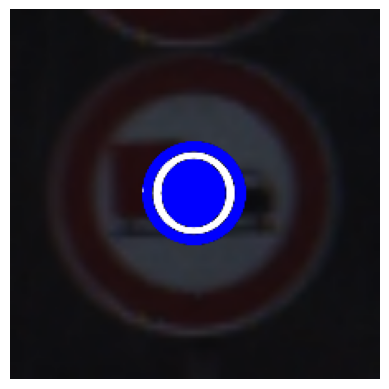

Displaying image at index 31359, Label: 14


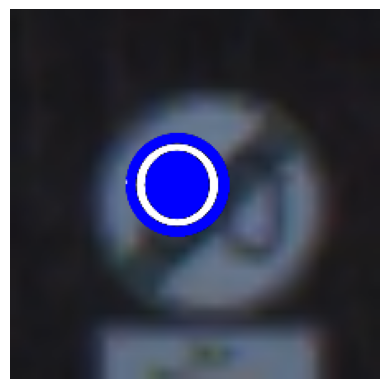

Displaying image at index 26190, Label: 14


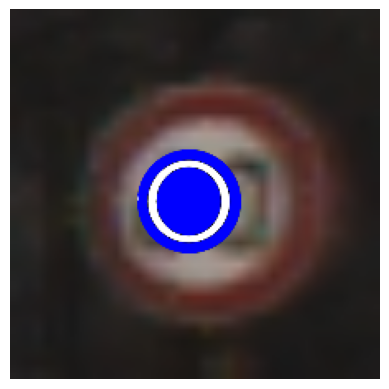

Displaying image at index 29321, Label: 14


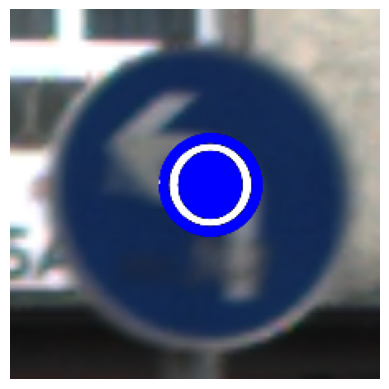

Displaying image at index 8196, Label: 14


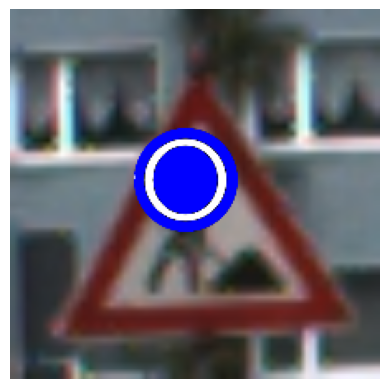

Displaying image at index 9920, Label: 14


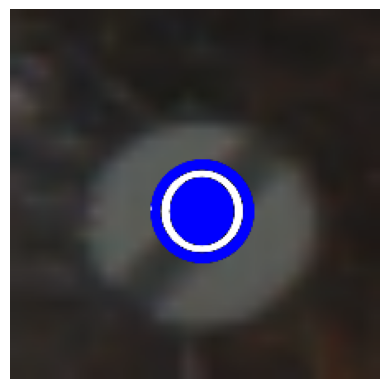

Displaying image at index 26194, Label: 14


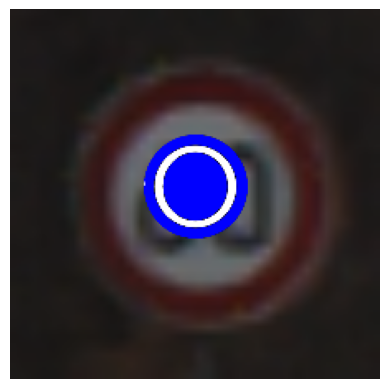

Displaying image at index 12003, Label: 14


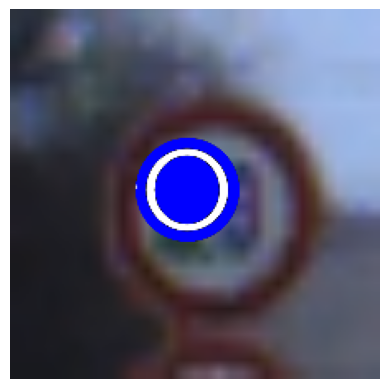

Displaying image at index 16492, Label: 14


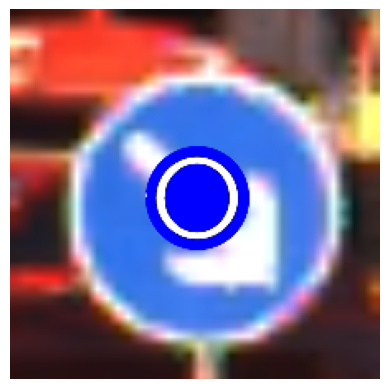

Displaying image at index 20405, Label: 14


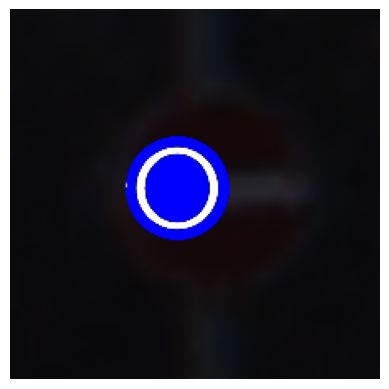

Displaying image at index 14800, Label: 14


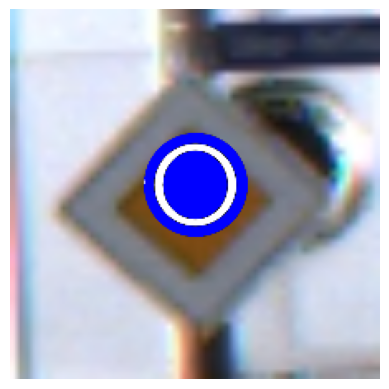

Training Configuration:  2


100%|██████████| 793/793 [00:59<00:00, 13.31it/s]


[class-0] silhouette_score = 0.393353 || ratio of 0.339286 
[class-1] silhouette_score = 0.314313 || ratio of 0.440878 
[class-2] silhouette_score = 0.306322 || ratio of 0.431667 
[class-3] silhouette_score = 0.239597 || ratio of 0.434397 
[class-4] silhouette_score = 0.278158 || ratio of 0.469066 
[class-5] silhouette_score = 0.253073 || ratio of 0.411962 
[class-6] silhouette_score = 0.188469 || ratio of 0.416667 
[class-7] silhouette_score = 0.296758 || ratio of 0.348958 
[class-8] silhouette_score = 0.335223 || ratio of 0.480496 
[class-9] silhouette_score = 0.256590 || ratio of 0.376701 
[class-10] silhouette_score = 0.297889 || ratio of 0.403607 
[class-11] silhouette_score = 0.307993 || ratio of 0.325758 
[class-12] silhouette_score = 0.327768 || ratio of 0.460119 
[class-13] silhouette_score = 0.278183 || ratio of 0.406829 
[class-14] silhouette_score = 0.856023 || ratio of 0.343158 
[class-15] silhouette_score = 0.293696 || ratio of 0.432540 
[class-16] silhouette_score = 0.27

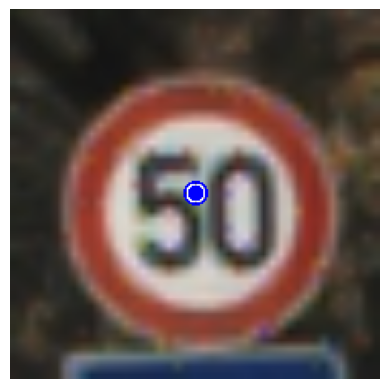

Displaying image at index 21520, Label: 14


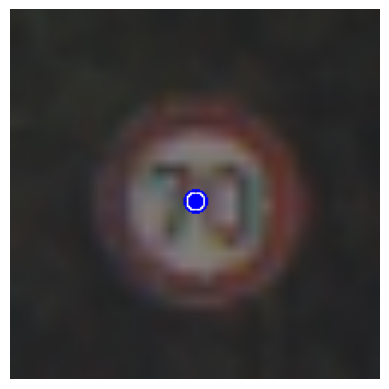

Displaying image at index 18351, Label: 14


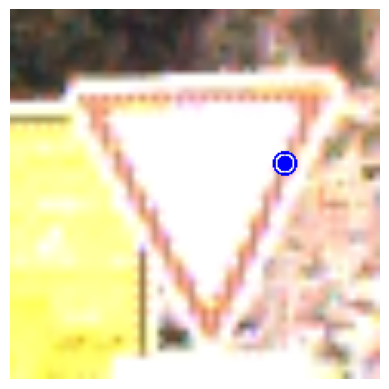

Displaying image at index 14810, Label: 14


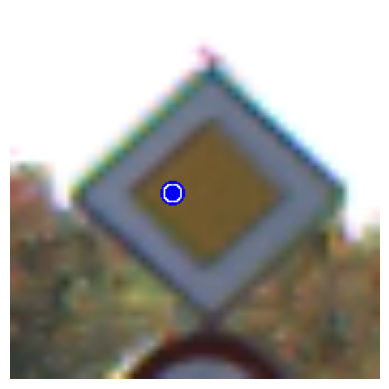

Displaying image at index 19, Label: 14


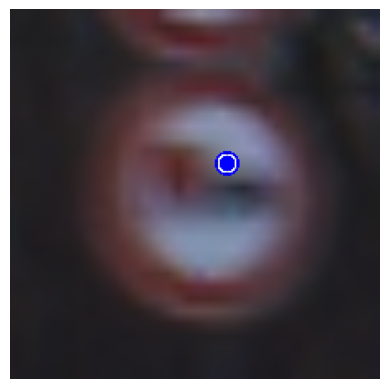

Displaying image at index 18353, Label: 14


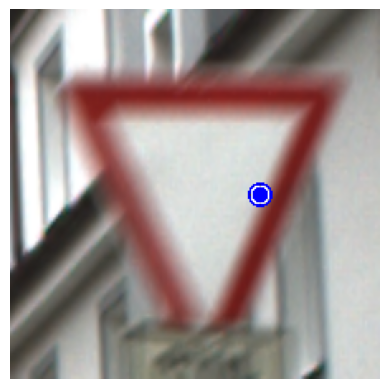

Displaying image at index 2115, Label: 14


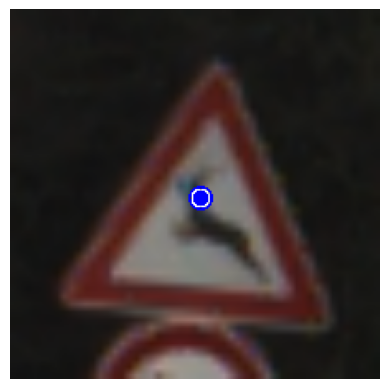

Displaying image at index 18355, Label: 14


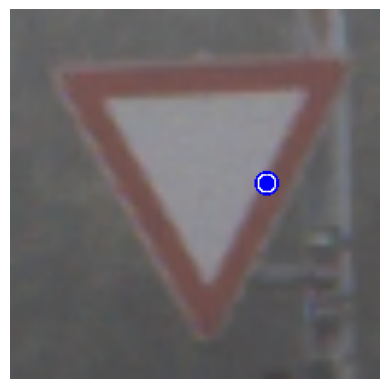

Displaying image at index 16520, Label: 14


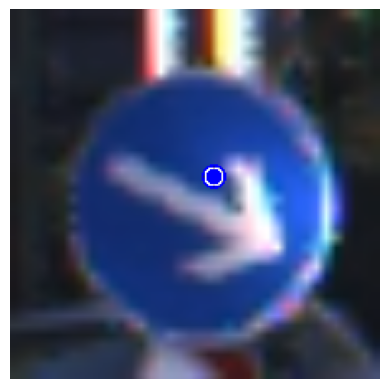

Displaying image at index 6407, Label: 14


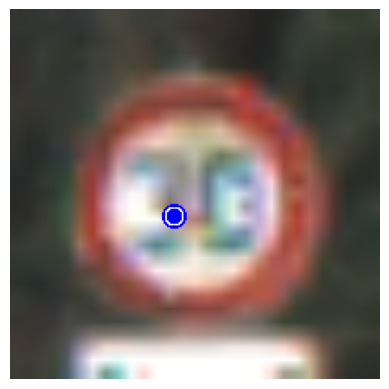

Displaying image at index 11472, Label: 14


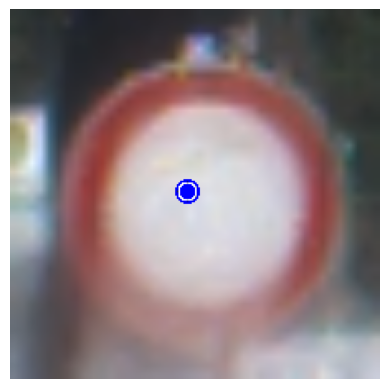

Training Configuration:  3


100%|██████████| 793/793 [01:02<00:00, 12.69it/s]


[class-0] silhouette_score = 0.423687 || ratio of 0.422619 
[class-1] silhouette_score = 0.344876 || ratio of 0.373874 
[class-2] silhouette_score = 0.359921 || ratio of 0.345556 
[class-3] silhouette_score = 0.354918 || ratio of 0.409574 
[class-4] silhouette_score = 0.337957 || ratio of 0.429924 
[class-5] silhouette_score = 0.332995 || ratio of 0.427419 
[class-6] silhouette_score = 0.349278 || ratio of 0.437500 
[class-7] silhouette_score = 0.329152 || ratio of 0.371528 
[class-8] silhouette_score = 0.376053 || ratio of 0.406915 
[class-9] silhouette_score = 0.301753 || ratio of 0.387755 
[class-10] silhouette_score = 0.306673 || ratio of 0.421642 
[class-11] silhouette_score = 0.203267 || ratio of 0.388258 
[class-12] silhouette_score = 0.338897 || ratio of 0.417262 
[class-13] silhouette_score = 0.292350 || ratio of 0.395255 
[class-14] silhouette_score = 0.761774 || ratio of 0.323158 
[class-15] silhouette_score = 0.249906 || ratio of 0.472222 
[class-16] silhouette_score = 0.38

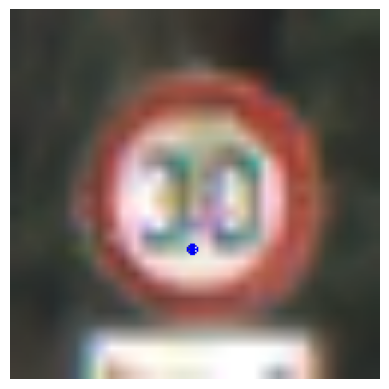

Displaying image at index 10130, Label: 14


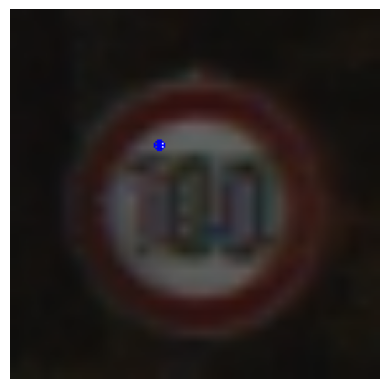

Displaying image at index 21, Label: 14


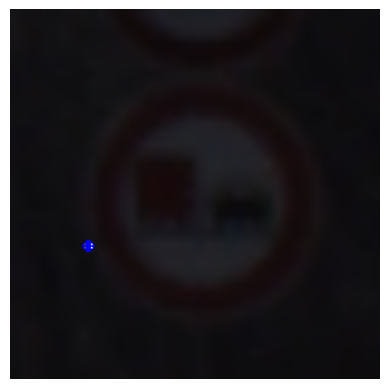

Displaying image at index 18333, Label: 14


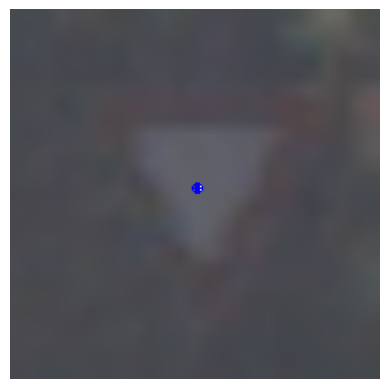

Displaying image at index 5417, Label: 14


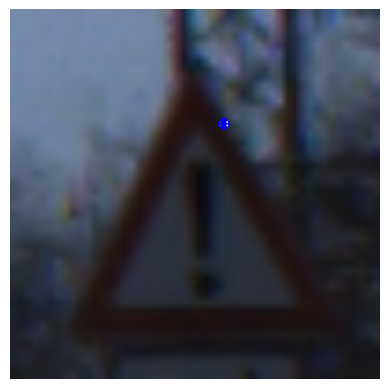

Displaying image at index 11, Label: 14


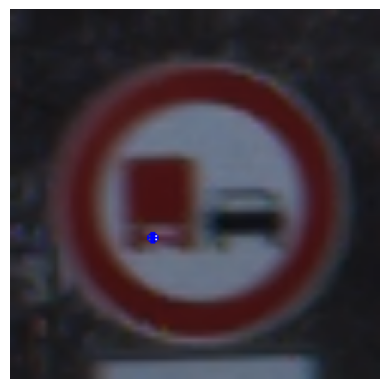

Displaying image at index 27501, Label: 14


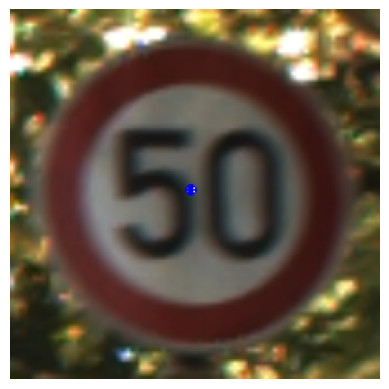

Displaying image at index 26190, Label: 14


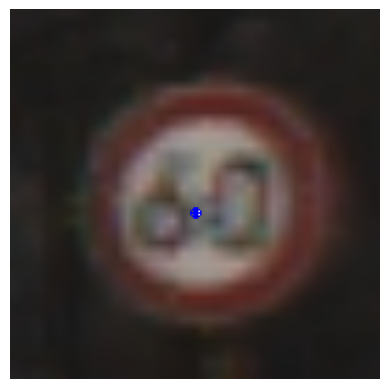

Displaying image at index 14479, Label: 14


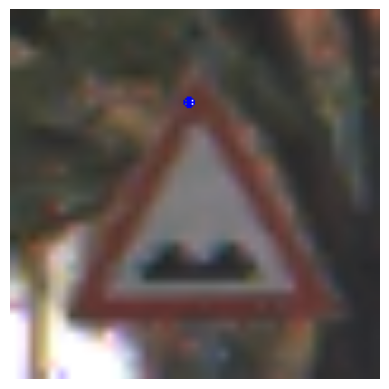

Displaying image at index 21528, Label: 14


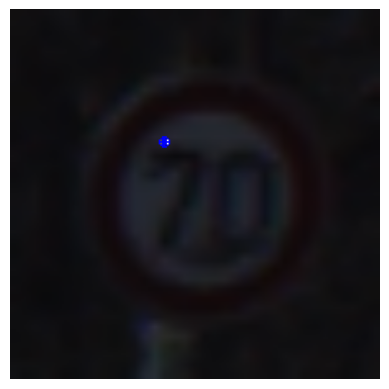

Displaying image at index 29949, Label: 14


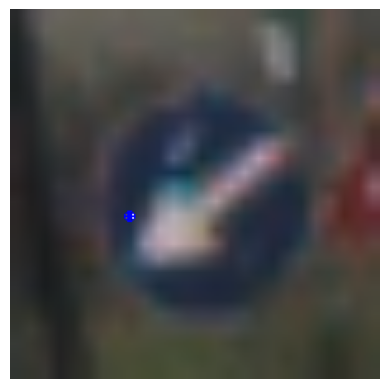

Training Configuration:  4


100%|██████████| 793/793 [00:59<00:00, 13.37it/s]


[class-0] silhouette_score = 0.384868 || ratio of 0.422619 
[class-1] silhouette_score = 0.346222 || ratio of 0.385698 
[class-2] silhouette_score = 0.301176 || ratio of 0.390000 
[class-3] silhouette_score = 0.360432 || ratio of 0.482270 
[class-4] silhouette_score = 0.350292 || ratio of 0.438763 
[class-5] silhouette_score = 0.279874 || ratio of 0.450269 
[class-6] silhouette_score = 0.290056 || ratio of 0.348214 
[class-7] silhouette_score = 0.358195 || ratio of 0.439236 
[class-8] silhouette_score = 0.272855 || ratio of 0.449468 
[class-9] silhouette_score = 0.386205 || ratio of 0.479592 
[class-10] silhouette_score = 0.265646 || ratio of 0.437811 
[class-11] silhouette_score = 0.322699 || ratio of 0.379735 
[class-12] silhouette_score = 0.390344 || ratio of 0.495238 
[class-13] silhouette_score = 0.330722 || ratio of 0.349537 
[class-14] silhouette_score = 0.689936 || ratio of 0.270526 
[class-15] silhouette_score = 0.328936 || ratio of 0.406746 
[class-16] silhouette_score = 0.31

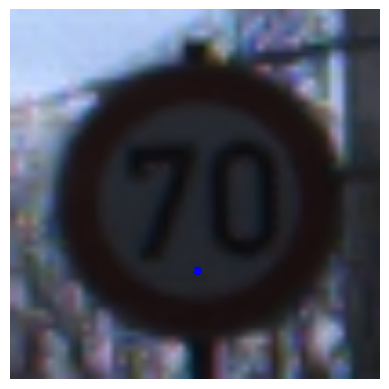

Displaying image at index 3944, Label: 14


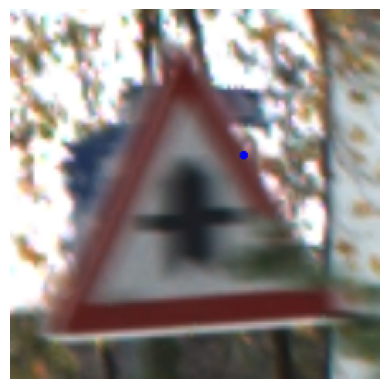

Displaying image at index 10114, Label: 14


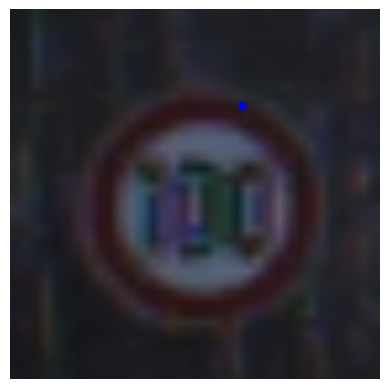

Displaying image at index 6379, Label: 14


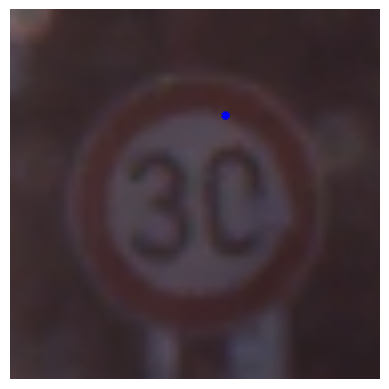

Displaying image at index 2121, Label: 14


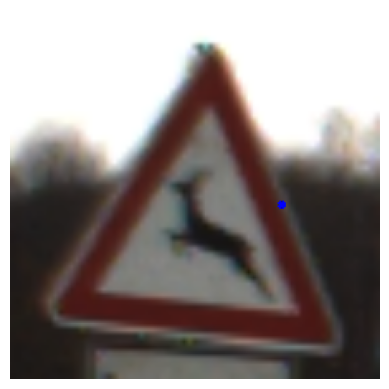

Displaying image at index 3942, Label: 14


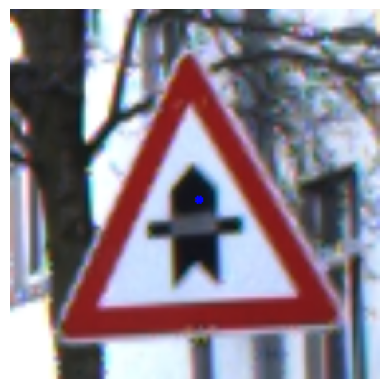

Displaying image at index 27523, Label: 14


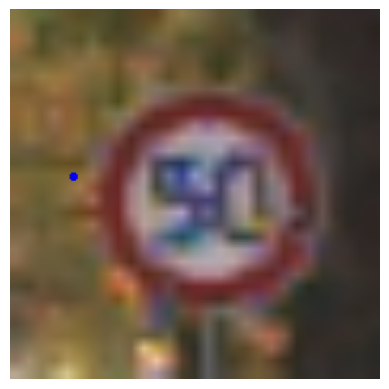

Displaying image at index 8196, Label: 14


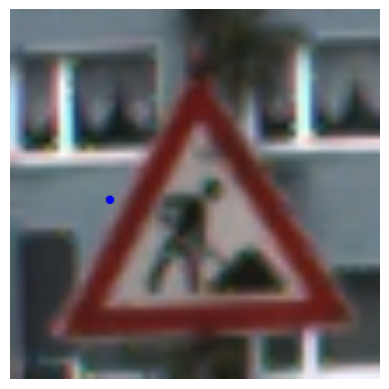

Displaying image at index 5411, Label: 14


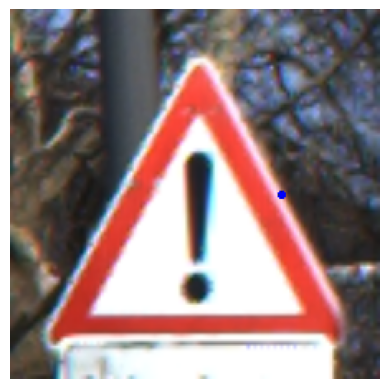

Displaying image at index 8188, Label: 14


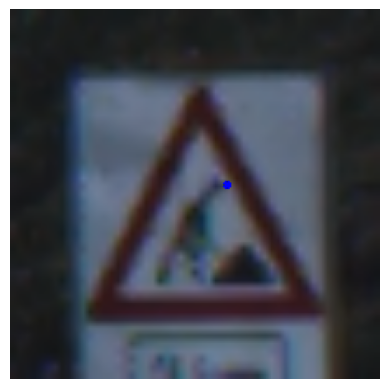

Displaying image at index 27513, Label: 14


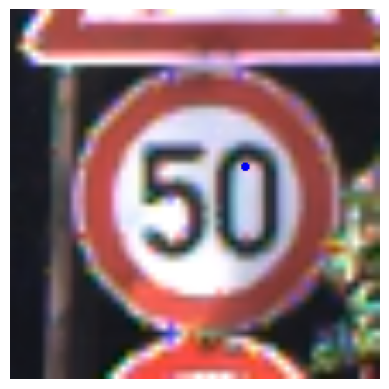

Training Configuration:  5


100%|██████████| 793/793 [00:59<00:00, 13.33it/s]


[class-0] silhouette_score = 0.347387 || ratio of 0.428571 
[class-1] silhouette_score = 0.418673 || ratio of 0.461149 
[class-2] silhouette_score = 0.283042 || ratio of 0.436667 
[class-3] silhouette_score = 0.302461 || ratio of 0.457447 
[class-4] silhouette_score = 0.302944 || ratio of 0.421086 
[class-5] silhouette_score = 0.364343 || ratio of 0.491935 
[class-6] silhouette_score = 0.284750 || ratio of 0.416667 
[class-7] silhouette_score = 0.325481 || ratio of 0.332465 
[class-8] silhouette_score = 0.354116 || ratio of 0.421986 
[class-9] silhouette_score = 0.302105 || ratio of 0.379252 
[class-10] silhouette_score = 0.330172 || ratio of 0.396766 
[class-11] silhouette_score = 0.354882 || ratio of 0.377841 
[class-12] silhouette_score = 0.364824 || ratio of 0.429762 
[class-13] silhouette_score = 0.281996 || ratio of 0.425347 
[class-14] silhouette_score = 0.280011 || ratio of 0.467368 
[class-15] silhouette_score = 0.308664 || ratio of 0.492063 
[class-16] silhouette_score = 0.36

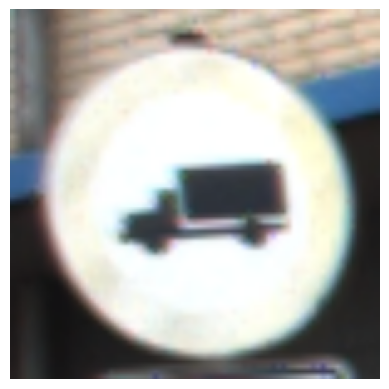

Displaying image at index 9813, Label: 16


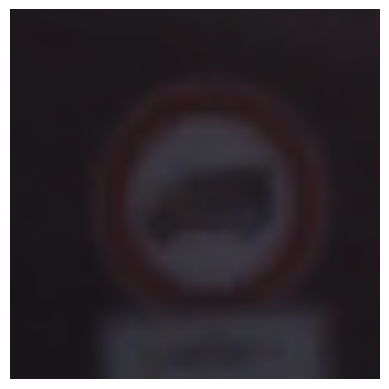

Displaying image at index 9753, Label: 16


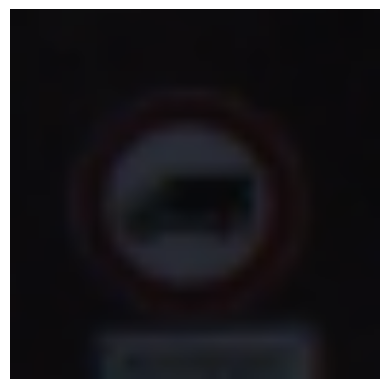

Displaying image at index 9678, Label: 16


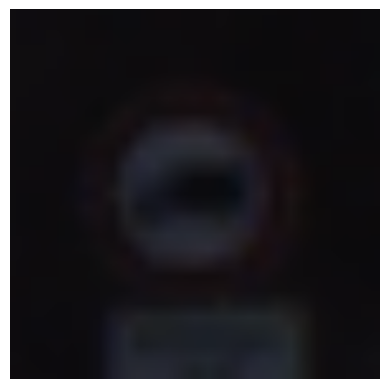

Displaying image at index 9736, Label: 16


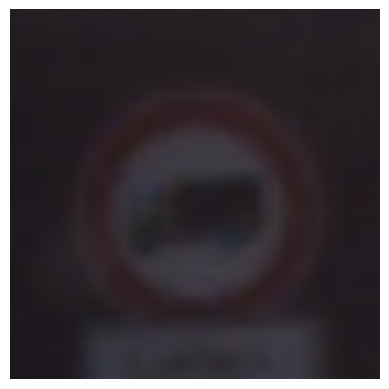

Displaying image at index 9652, Label: 16


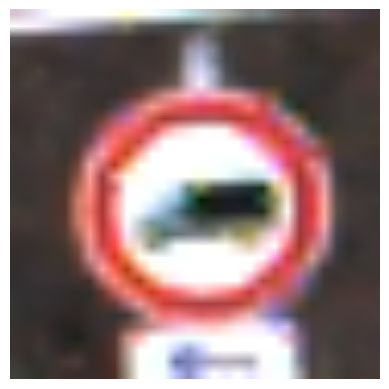

Displaying image at index 9680, Label: 16


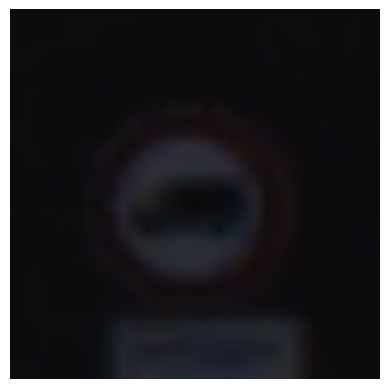

Displaying image at index 9677, Label: 16


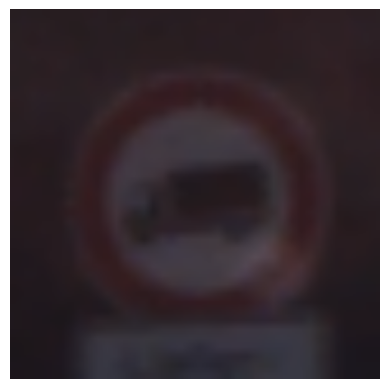

Displaying image at index 9780, Label: 16


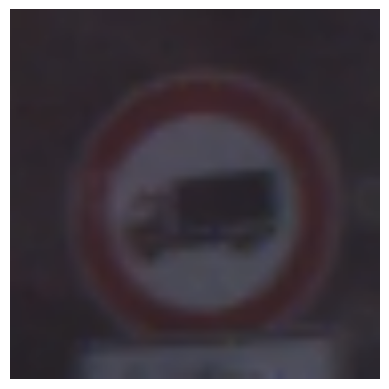

Displaying image at index 9723, Label: 16


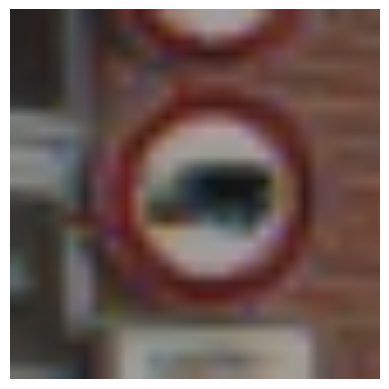

Displaying image at index 9738, Label: 16


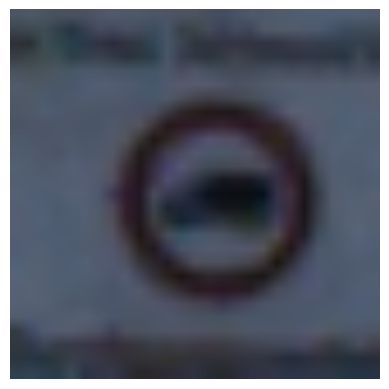

Training Configuration:  6


100%|██████████| 793/793 [00:59<00:00, 13.33it/s]


[class-0] silhouette_score = 0.338249 || ratio of 0.452381 
[class-1] silhouette_score = 0.372600 || ratio of 0.381757 
[class-2] silhouette_score = 0.266216 || ratio of 0.428889 
[class-3] silhouette_score = 0.334063 || ratio of 0.372340 
[class-4] silhouette_score = 0.332348 || ratio of 0.404040 
[class-5] silhouette_score = 0.334986 || ratio of 0.484543 
[class-6] silhouette_score = 0.312039 || ratio of 0.434524 
[class-7] silhouette_score = 0.361089 || ratio of 0.375868 
[class-8] silhouette_score = 0.379841 || ratio of 0.457447 
[class-9] silhouette_score = 0.317520 || ratio of 0.372449 
[class-10] silhouette_score = 0.259355 || ratio of 0.398632 
[class-11] silhouette_score = 0.260484 || ratio of 0.299242 
[class-12] silhouette_score = 0.342087 || ratio of 0.498214 
[class-13] silhouette_score = 0.275136 || ratio of 0.425347 
[class-14] silhouette_score = 0.893819 || ratio of 0.343158 
[class-15] silhouette_score = 0.315435 || ratio of 0.436508 
[class-16] silhouette_score = 0.28

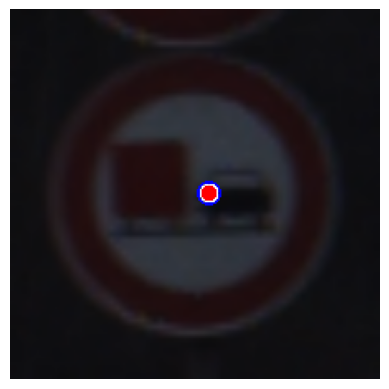

Displaying image at index 10114, Label: 14


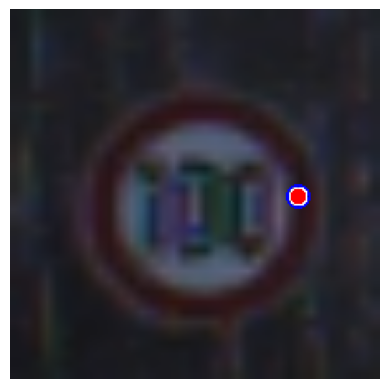

Displaying image at index 29323, Label: 14


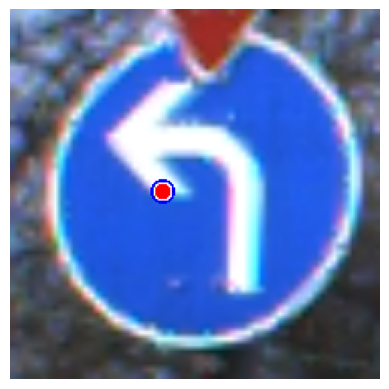

Displaying image at index 18333, Label: 14


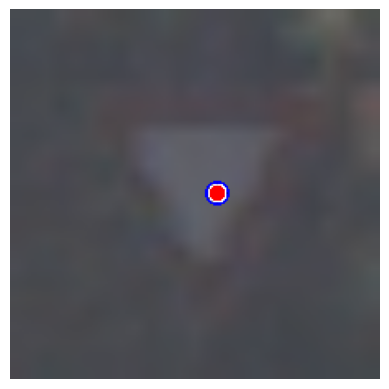

Displaying image at index 23843, Label: 14


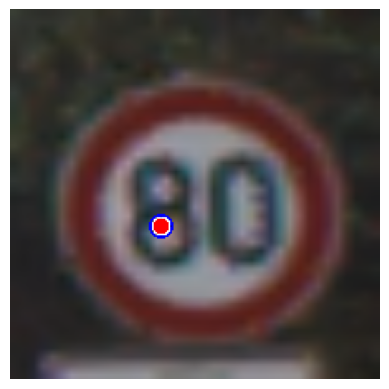

Displaying image at index 26204, Label: 14


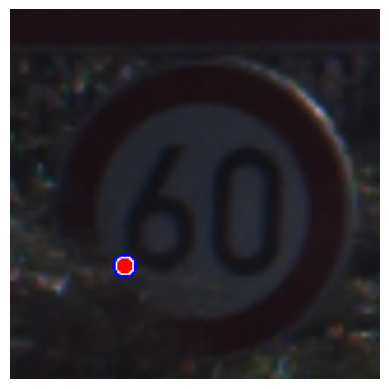

Displaying image at index 21522, Label: 14


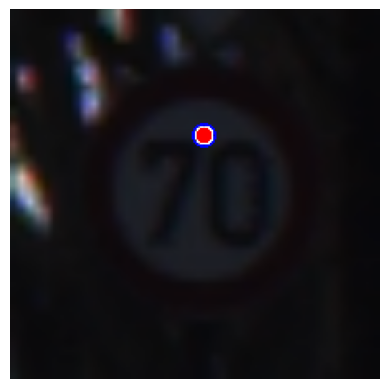

Displaying image at index 20401, Label: 14


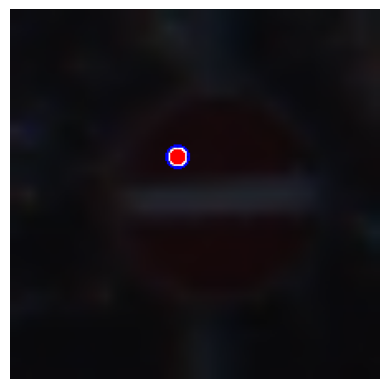

Displaying image at index 9387, Label: 14


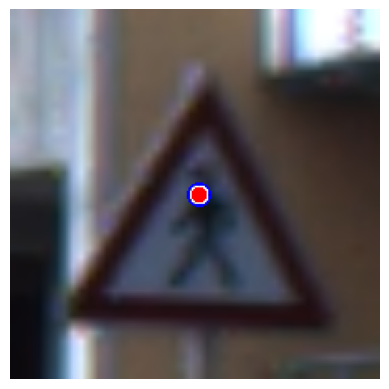

Displaying image at index 27525, Label: 14


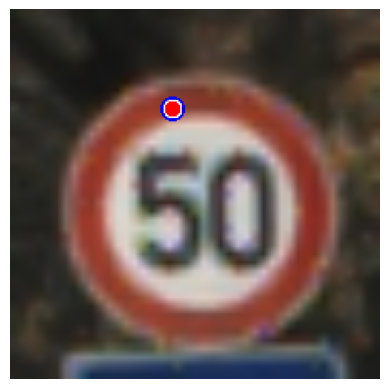

Displaying image at index 18164, Label: 14


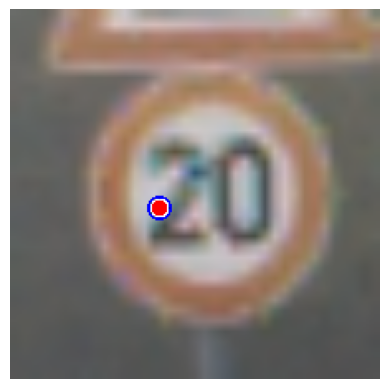

Training Configuration:  7


100%|██████████| 793/793 [01:03<00:00, 12.58it/s]


[class-0] silhouette_score = 0.293555 || ratio of 0.375000 
[class-1] silhouette_score = 0.307910 || ratio of 0.429054 
[class-2] silhouette_score = 0.281693 || ratio of 0.371667 
[class-3] silhouette_score = 0.369706 || ratio of 0.487589 
[class-4] silhouette_score = 0.325130 || ratio of 0.498737 
[class-5] silhouette_score = 0.280471 || ratio of 0.410618 
[class-6] silhouette_score = 0.257208 || ratio of 0.488095 
[class-7] silhouette_score = 0.306157 || ratio of 0.338542 
[class-8] silhouette_score = 0.259036 || ratio of 0.474291 
[class-9] silhouette_score = 0.273625 || ratio of 0.386905 
[class-10] silhouette_score = 0.252575 || ratio of 0.402985 
[class-11] silhouette_score = 0.329922 || ratio of 0.350379 
[class-12] silhouette_score = 0.394764 || ratio of 0.460119 
[class-13] silhouette_score = 0.293344 || ratio of 0.402199 
[class-14] silhouette_score = 0.817482 || ratio of 0.332632 
[class-15] silhouette_score = 0.343925 || ratio of 0.474206 
[class-16] silhouette_score = 0.37

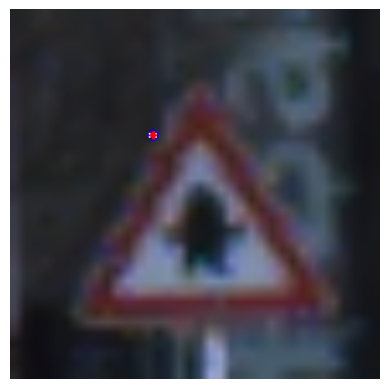

Displaying image at index 27537, Label: 14


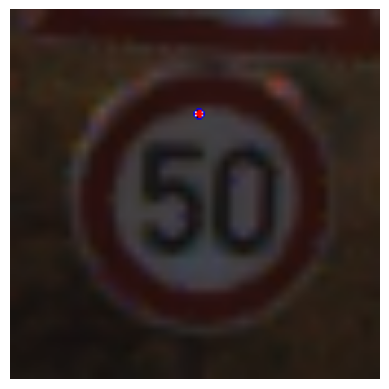

Displaying image at index 21522, Label: 14


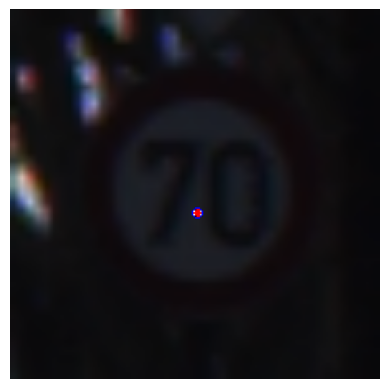

Displaying image at index 21542, Label: 14


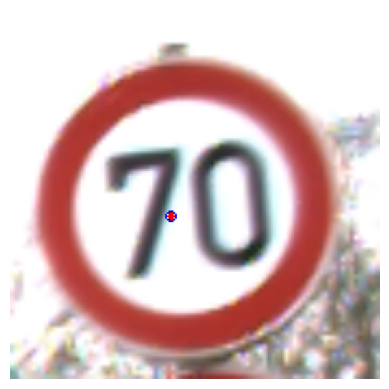

Displaying image at index 10130, Label: 14


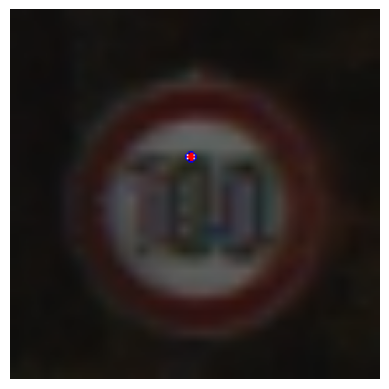

Displaying image at index 25317, Label: 14


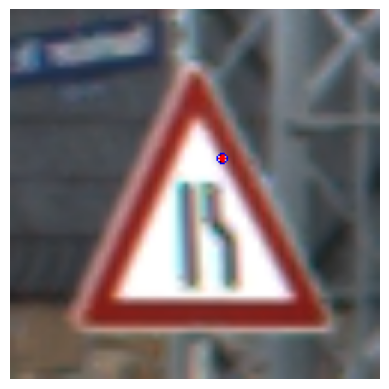

Displaying image at index 23815, Label: 14


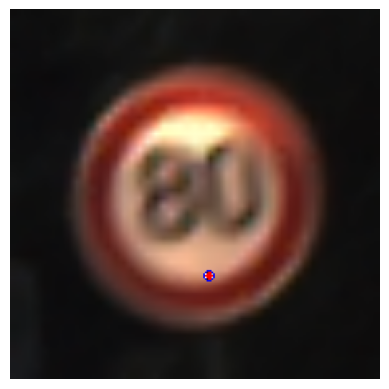

Displaying image at index 1630, Label: 14


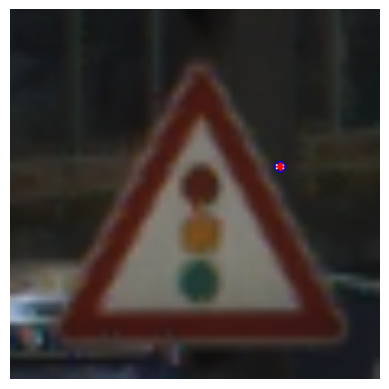

Displaying image at index 16502, Label: 14


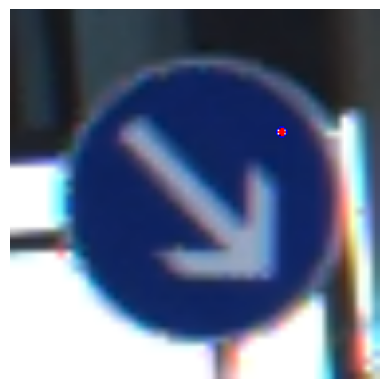

Displaying image at index 14808, Label: 14


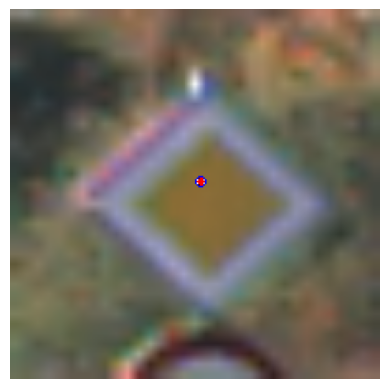

Displaying image at index 8192, Label: 14


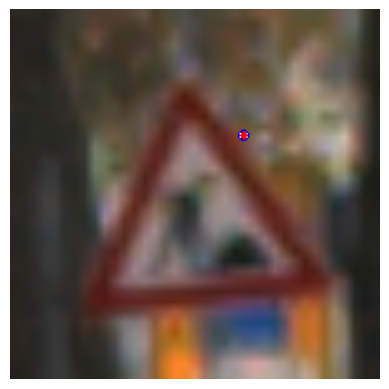

Training Configuration:  8


100%|██████████| 793/793 [01:22<00:00,  9.58it/s]


[class-0] silhouette_score = 0.291475 || ratio of 0.416667 
[class-1] silhouette_score = 0.330780 || ratio of 0.389640 
[class-2] silhouette_score = 0.237746 || ratio of 0.447222 
[class-3] silhouette_score = 0.376745 || ratio of 0.444149 
[class-4] silhouette_score = 0.221480 || ratio of 0.497475 
[class-5] silhouette_score = 0.341760 || ratio of 0.447581 
[class-6] silhouette_score = 0.398402 || ratio of 0.372024 
[class-7] silhouette_score = 0.314224 || ratio of 0.359375 
[class-8] silhouette_score = 0.311427 || ratio of 0.498227 
[class-9] silhouette_score = 0.359076 || ratio of 0.427721 
[class-10] silhouette_score = 0.321101 || ratio of 0.363184 
[class-11] silhouette_score = 0.320743 || ratio of 0.296402 
[class-12] silhouette_score = 0.366836 || ratio of 0.451786 
[class-13] silhouette_score = 0.258935 || ratio of 0.309606 
[class-14] silhouette_score = 0.834511 || ratio of 0.335789 
[class-15] silhouette_score = 0.311594 || ratio of 0.384921 
[class-16] silhouette_score = 0.30

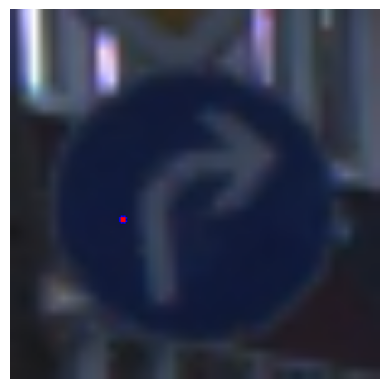

Displaying image at index 16512, Label: 14


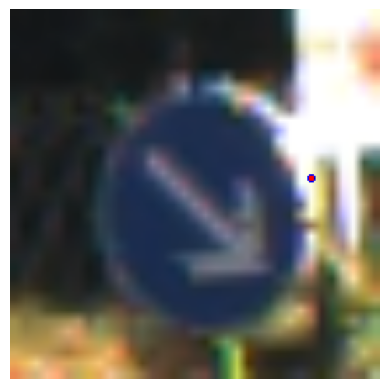

Displaying image at index 2113, Label: 14


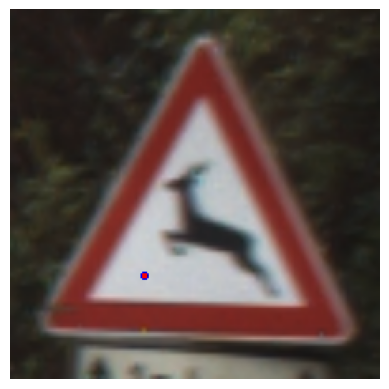

Displaying image at index 23817, Label: 14


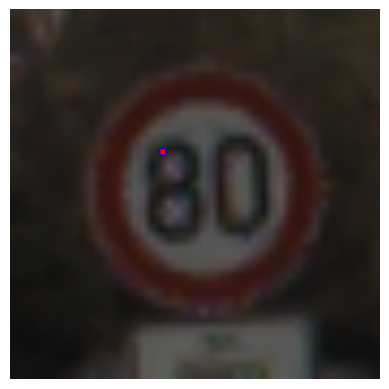

Displaying image at index 31161, Label: 14


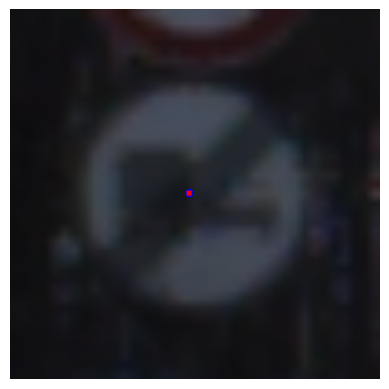

Displaying image at index 27521, Label: 14


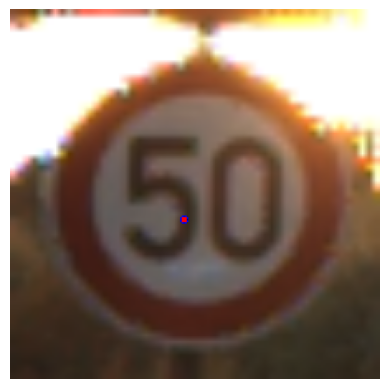

Displaying image at index 21512, Label: 14


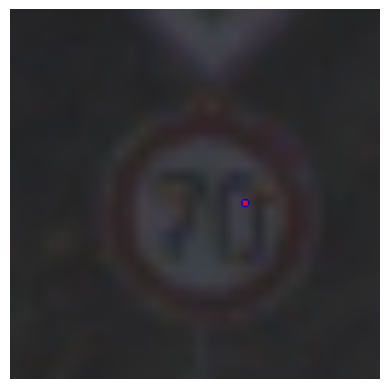

Displaying image at index 3948, Label: 14


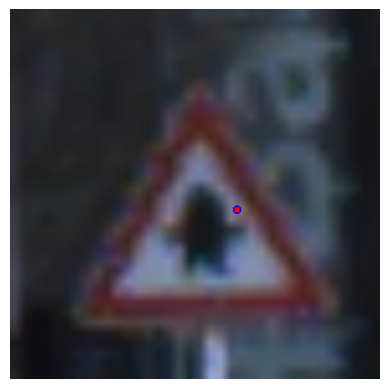

Displaying image at index 33, Label: 14


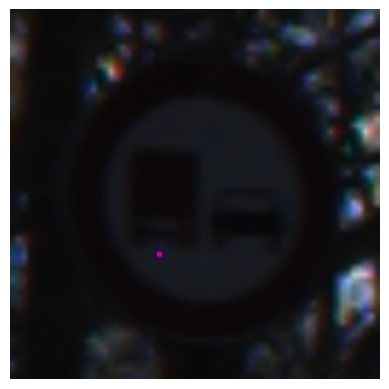

Displaying image at index 25319, Label: 14


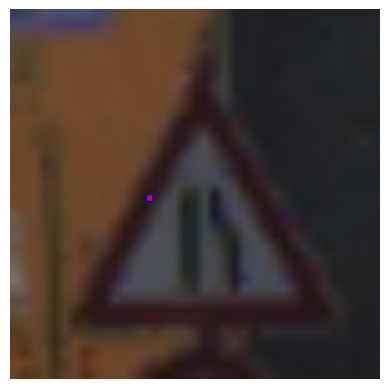

Displaying image at index 11995, Label: 14


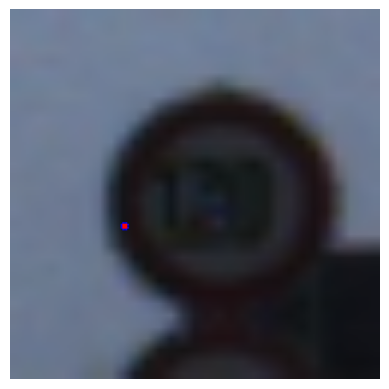

In [30]:
import torchvision.transforms as T 
from torch.utils.data import DataLoader, random_split, Dataset

configurations = [
    {'test_number': 1, 'shape': 'Square', 'location': 'Random', 'coverage': 0.08, 'pattern': 'patch_1'},
    {'test_number': 2, 'shape': 'Square', 'location': 'Random', 'coverage': 0.005, 'pattern': 'patch_1'},
    {'test_number': 3, 'shape': 'Square', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
    {'test_number': 4, 'shape': 'Square', 'location': 'Random', 'coverage': 0.0005, 'pattern': 'patch_1'},
    {'test_number': 5, 'shape': 'Square', 'location': 'Random', 'coverage':  0.08, 'pattern': 'patch_2'},
    {'test_number': 6, 'shape': 'Square', 'location': 'Random', 'coverage':  0.005, 'pattern': 'patch_2'},
    {'test_number': 7, 'shape': 'Square', 'location': 'Random', 'coverage':  0.001, 'pattern': 'patch_2'},
    {'test_number': 8, 'shape': 'Square', 'location': 'Random', 'coverage':  0.0005, 'pattern': 'patch_2'},
    
#     {'test_number': 9, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 10, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 11, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 12, 'shape': 'Circle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 13, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 14, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 15, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 16, 'shape': 'Circle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
    
#     {'test_number': 17, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_1'},
#     {'test_number': 18, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.01, 'pattern': 'patch_2'},
#     {'test_number': 19, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_1'},
#     {'test_number': 20, 'shape': 'Triangle', 'location': 'Random', 'coverage': 0.001, 'pattern': 'patch_2'},
#     {'test_number': 21, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_1'},
#     {'test_number': 22, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.01, 'pattern': 'patch_2'},
#     {'test_number': 23, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_1'},
#     {'test_number': 24, 'shape': 'Triangle', 'location': 'Fixed', 'coverage':  0.001, 'pattern': 'patch_2'},
]


#import the patches
patch_1 = 'gtsrb-german-traffic-sign/Patches/patch_5.png'
patch_1_circle = 'gtsrb-german-traffic-sign/Patches/patch_1_circle.png'
patch_1_triangle = 'gtsrb-german-traffic-sign/Patches/patch_1_triangle.png'
patch_2= 'gtsrb-german-traffic-sign/Patches/patch_6.png'
patch_2_circle = 'gtsrb-german-traffic-sign/Patches/patch_2_circle.png'
patch_2_triangle = 'gtsrb-german-traffic-sign/Patches/patch_2_triangle.png'


training_root_dir = 'gtsrb-german-traffic-sign/Train_og'
validation_root_dir = 'gtsrb-german-traffic-sign/Clean_Validation'   
test_images_dir = 'gtsrb-german-traffic-sign/Test'
test_csv_path = 'gtsrb-german-traffic-sign/Test.csv'

# data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True),T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
data_transforms = T.Compose([T.ToTensor(),T.Resize((224,224),antialias=True)])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for config in configurations:
    # Extract the configuration details
    test_number = config['test_number']
    shape = config['shape']
    position_state = config['location']
    patch_coverage_percentage = config['coverage']
    pattern = config['pattern']
    print("Training Configuration: ",test_number)
    
    # Map pattern to the appropriate patch path
    if pattern == 'patch_1':
        if shape=='Square':
            patch_path = patch_1  
        elif shape=='Circle':
            patch_path = patch_1_circle  
        elif shape=='Triangle':
            patch_path = patch_1_triangle  
    elif pattern == 'patch_2':
        if shape=='Square':
            patch_path = patch_2  
        elif shape=='Circle':
            patch_path = patch_2_circle  
        elif shape=='Triangle':
            patch_path = patch_2_triangle  
            
    poison_config = {
    'patch_path': patch_path,
    'position_state': position_state,  
    'patch_coverage_percentage': patch_coverage_percentage, 
    }
    
    training_target_img = 350
    valid_target_img = 105
    target_label = 14  # Assuming you want all poisoned images to have the same target label

    #TRAINING DATA(CLEAN AND BACKDOORED)
    train_dataset = BackdooredandClean(root_dir=training_root_dir,transform=data_transforms,
                    poison=True,poison_config=poison_config,target_images_total=training_target_img,target_label=target_label)
    train_loader = DataLoader(dataset=train_dataset, batch_size=40, shuffle=True)
    
#     #CLEAN VALIDATION
#     clean_validation_dataset = BackdooredandClean(root_dir=validation_root_dir,transform=data_transforms,
#                             poison=False,poison_config=poison_config,target_images_total=0, target_label=target_label)
#     clean_val_loader = DataLoader(dataset=clean_validation_dataset, batch_size=32, shuffle=False)
#     print("validation length: ",len(clean_val_loader.dataset))
#     #BACKDOORED VALIDATION
#     backdoored_validation_dataset = BackdooredValid(root_dir=validation_root_dir,transform=data_transforms,poison=True,
#                             poison_config=poison_config,target_images_total=valid_target_img,target_label=target_label)
#     backdoor_val_loader = DataLoader(dataset=backdoored_validation_dataset, batch_size=32, shuffle=False)

    
#     Test_clean_dataset = CleanTest(test_images_dir, test_csv_path, transform=data_transforms)
#     clean_test_loader = DataLoader(dataset=Test_clean_dataset, batch_size=32, shuffle=False)

#     test_poisoned_img = 400  # Specify how many images you want to poison
#     Test_backdoored_dataset = BackdooredTest(test_images_dir, test_csv_path, transform=data_transforms, poison=True, poison_config=poison_config, target_label=target_label, num_poisoned_images=test_poisoned_img)
#     backdoor_test_loader = DataLoader(dataset=Test_backdoored_dataset, batch_size=32, shuffle=False)

#     dataloaders = {'training':train_loader,"clean": clean_val_loader, "backdoor": backdoor_val_loader}
#     dataset_sizes = {'training':len(train_loader.dataset), "clean": len(clean_val_loader.dataset), "backdoor": len(backdoor_val_loader.dataset)}
#     print(dataset_sizes)
    
#     #splitting the data into training and validation 
#     L1 = len(clean_test_loader.dataset)
#     L2 = len(Test_backdoored_dataset)
#     print(f"Total length of Dataset Imported: ",L1,L2)
    
    #     # Initialize the model
    num_classes = 43  # The number of output classes in your trained model
    model = resnet50(weights=None)  # Load the model without pretrained weights
    num_classes = 43
    model.fc = nn.Linear(model.fc.in_features, num_classes)  # Adjust the fully connected layer
    model_path = f"Final_Models/test_2_resnet50_epochs100_backdoored_config{test_number}.pt"
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)


    ##CLEANING THE TRAINING DATASET################################
    # Assuming suspicious_indices is a list of indices for suspicious images
    most_suspicious_class,suspicious_indices = cleanser(train_loader, model, num_classes, device,verify_suspicious_indices)
    print("Len of suspicious indices: ",len(suspicious_indices))

    calculate_fp_and_fpr(train_loader.dataset, suspicious_indices)

    calculate_fn_and_fnr(train_loader.dataset, suspicious_indices)
    view_suspicious_images(train_loader.dataset, suspicious_indices)
#     # Assuming `train_data` is your pre-loaded data that you want to pass to the class
#     cleaned_dataset = CleanTraining(data=train_dataset, transform=data_transforms,
#                                          poison_config=poison_config, suspicious_indices=suspicious_indices)
#     print("Len of cleaned data: ", len(cleaned_dataset))

    
#     # Initialize the model
#     model = resnet50(weights=None, num_classes=43).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)
#     num_epochs = 5
#     out_path = f"Final_Models/test_1_resnet50_epochs100_backdoored_config{test_number}.pt"

#     # Store metrics
#     train_loss, clean_val_loss,backdoored_val_loss = [], [], []
#     train_acc, clen_val_acc,val_backdoored_acc = [], [], []
#     # Train the model
#     plot_file_name = f"plots/test_1_plot_of_config_{test_number}.png"
#     train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc, val_backdoored_acc,best_acc = Train(model, criterion, optimizer, num_epochs, dataset_sizes, dataloaders, out_path,device)
#     plot_accuracy(train_loss, clean_val_loss,backdoored_val_loss ,train_acc, clean_val_acc,val_backdoored_acc,plot_file_name)
#     print('Best validation Accuracy:', best_acc)
    
#     test_clean(model,clean_test_loader,device)
#     test_backdoored(model,backdoor_test_loader,device)
    


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def blend_trigger(trigger, background, position, alpha=0.5):
    trigger_height, trigger_width = trigger.shape[:2]
    
    # Resize the trigger to fit the area on the background
    trigger_resized = cv2.resize(trigger, (15, 15))  # Use actual size

    # Region where the trigger will be placed
    roi = background[position[1]:position[1]+trigger_height, position[0]:position[0]+trigger_width]

    # Create a mask for the trigger and an inverse mask
    grayscale_trigger = cv2.cvtColor(trigger_resized, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(grayscale_trigger, 1, 255, cv2.THRESH_BINARY)

    # Resize mask to match the ROI
    mask = cv2.resize(mask, (roi.shape[1], roi.shape[0]))
    inverse_mask = cv2.bitwise_not(mask)

    # Use the masks to put the trigger in the ROI and modify the background
    background_with_trigger = cv2.add(cv2.bitwise_and(roi, roi, mask=inverse_mask), cv2.bitwise_and(trigger_resized, trigger_resized, mask=mask))

    # Blend the trigger and background
    blended = cv2.addWeighted(roi, 1 - alpha, background_with_trigger, alpha, 0)

    # Put the blended area back into the original image
    background[position[1]:position[1]+trigger_height, position[0]:position[0]+trigger_width] = blended

    return background

# Load the images
background_img = cv2.imread('/scratch/ltl2113/Honors_Research/gtsrb-german-traffic-sign/Train_official_full_dataset/0/00000_00000_00007.png')
trigger_img = cv2.imread('/scratch/ltl2113/Honors_Research/gtsrb-german-traffic-sign/Patches/patch_1.png')  # Assuming it does NOT have an alpha channel

# Get the size of the trigger image
trigger_height, trigger_width = trigger_img.shape[:2]

# Position where the trigger will be placed
trigger_position = (50, 50)  # Adjust the position as needed

# Perform blending
blended_image = blend_trigger(trigger_img, background_img, trigger_position)

# Display the blended image
plt.imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Hide axis labels
plt.show()


error: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/resize.cpp:4155: error: (-215:Assertion failed) inv_scale_x > 0 in function 'resize'
